In [ ]:
!pip install --upgrade sklearn
!pip install --upgrade plotly
!pip install jupyter-dash
!pip install cufflinks --upgrade
!pip install ftfy
!pip install langdetect
!pip install --upgrade Tensorflow
!pip install --upgrade Imbalanced-Learn

Requirement already up-to-date: sklearn in /usr/local/lib/python3.7/dist-packages (0.0)
     |████████████████████████████████| 19.1MB 1.2MB/s 
  Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1
     |████████████████████████████████| 81kB 6.2MB/s 
     |████████████████████████████████| 1.0MB 13.4MB/s 
     |████████████████████████████████| 3.5MB 29.1MB/s 
     |████████████████████████████████| 92kB 6.4MB/s 
     |████████████████████████████████| 1.8MB 46.9MB/s 
     |████████████████████████████████| 358kB 45.2MB/s 
  Created wheel for dash: filename=dash-1.20.0-cp37-none-any.whl size=85845 sha256=df88956ac2e2ea5133b6f31c43605ca6dfd6c0bd4b6f3b377f523c8a2c91f9bc
  Stored in directory: /root/.cache/pip/wheels/e6/33/41/ce361d0d1da277d2350f815b10f2ab1e331592d93ef2b07e29
  Created wheel for dash-renderer: filename=dash_renderer-1.9.1-cp37-none-any.whl size=1014873 sha256=e6a4273fadb02a123d3d441230c341f0816d26d077dce5b2

In [ ]:
import warnings
warnings.filterwarnings('ignore') 

# Utilities
from time import time
import os, sys, six, itertools, string, re, warnings, string, sklearn.neighbors._base, pickle
from ftfy import fix_encoding, fix_text, badness
sys.modules['sklearn.externals.six'] = six
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base

# Numerical calculation
import numpy as np

# Data Handling
import pandas as pd

# Data Visualization
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import seaborn as sns
import cufflinks as cf
import plotly as py
import plotly.express as px
import plotly.graph_objs as go
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from IPython.display import HTML

init_notebook_mode(connected=False)
cf.go_offline()
%matplotlib inline

#NLP
from collections import Counter
from langdetect import detect
import nltk
from nltk.corpus import stopwords
from nltk import tokenize
from textblob import Word
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from gensim.summarization import summarize

# Tools & Evaluation metrics
from scipy.stats import zscore
from sklearn import preprocessing
from sklearn.pipeline import Pipeline
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import label_binarize, MinMaxScaler
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from sklearn.metrics import roc_curve, roc_auc_score, auc, accuracy_score, precision_score, cohen_kappa_score, confusion_matrix, f1_score, classification_report, precision_recall_curve, precision_recall_fscore_support
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV, StratifiedKFold, RepeatedStratifiedKFold

# Sampling technique
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE, SMOTEN
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.combine import SMOTETomek, SMOTEENN

# Traditional Modeling
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
import xgboost as xgb

# Deep learning models
import tensorflow as tf
import keras
from keras import layers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.layers import Dense, Activation, Dropout, Input,  Flatten, Lambda, Conv1D, MaxPooling1D, Embedding, GRU, LSTM, Bidirectional
from keras.layers.embeddings import Embedding
from tensorflow.python.keras.preprocessing.text import Tokenizer
from tensorflow.python.keras.preprocessing.sequence import pad_sequences

In [ ]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [ ]:
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
 from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
project_path =  ('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/')
file_name ='input_data.xlsx'

ticket_df = pd.read_excel(project_path+file_name)
ticket_df.head(5)

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [ ]:
ticket_df.describe()

,Short description,Description,Caller,Assignment group
count,8492,8499,8500,8500
unique,7481,7817,2950,74
top,password reset,the,bpctwhsn kzqsbmtp,GRP_0
freq,38,56,810,3976


In [ ]:
ticket_df['Assignment group'].value_counts()

GRP_0     3976
GRP_8      661
GRP_24     289
GRP_12     257
GRP_9      252
          ... 
GRP_70       1
GRP_73       1
GRP_61       1
GRP_64       1
GRP_67       1
Name: Assignment group, Length: 74, dtype: int64

In [ ]:
ticket_df['Assignment group'].unique()

array(['GRP_0', 'GRP_1', 'GRP_3', 'GRP_4', 'GRP_5', 'GRP_6', 'GRP_7',
       'GRP_8', 'GRP_9', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_30', 'GRP_31',
       'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36', 'GRP_37', 'GRP_38',
       'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42', 'GRP_43', 'GRP_44',
       'GRP_45', 'GRP_46', 'GRP_47', 'GRP_48', 'GRP_49', 'GRP_50',
       'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56',
       'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60', 'GRP_61', 'GRP_32',
       'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67',
       'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73'],
      dtype=object)

In [ ]:
len(ticket_df['Assignment group'].unique())

74

Dataset contains 74 unique Assignment Groups

In [ ]:
tkt_df = ticket_df['Assignment group'].value_counts().reset_index()
tkt_df['percentage'] = (tkt_df['Assignment group']/tkt_df['Assignment group'].sum())*100
tkt_df.head()

,index,Assignment group,percentage
0,GRP_0,3976,46.776471
1,GRP_8,661,7.776471
2,GRP_24,289,3.400000
3,GRP_12,257,3.023529
4,GRP_9,252,2.964706


## **EXPLORATORY DATA ANALYSIS**

### **Basic Data Cleaning**

In [ ]:
ticket_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [ ]:
ticket_df.isnull().sum()

Short description    8
Description          1
Caller               0
Assignment group     0
dtype: int64

There are null values in columns - 'Short description' & 'Description'

In [ ]:
ticket_df[pd.isnull(ticket_df).any(axis=1)]

,Short description,Description,Caller,Assignment group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0



Remove null values by converting it to string

In [ ]:
# Convert datatype to string
ticket_df = ticket_df.applymap(str)
ticket_df.count()

Short description    8500
Description          8500
Caller               8500
Assignment group     8500
dtype: int64

In [ ]:
ticket_df[pd.isnull(ticket_df).any(axis=1)]

,Short description,Description,Caller,Assignment group


In [ ]:
ticket_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8500 non-null   object
 1   Description        8500 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [ ]:
#Concatenate Short Description and Description columns
ticket_df['Full_Description'] = ticket_df['Short description'] + ' ' +ticket_df['Description']
ticket_df.head(15)

,Short description,Description,Caller,Assignment group,Full_Description
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,unable to log in to engineering tool and skype...
6,event: critical:HostName_221.company.com the v...,event: critical:HostName_221.company.com the v...,jyoqwxhz clhxsoqy,GRP_1,event: critical:HostName_221.company.com the v...
7,ticket_no1550391- employment status - new non-...,ticket_no1550391- employment status - new non-...,eqzibjhw ymebpoih,GRP_0,ticket_no1550391- employment status - new non-...
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0,unable to disable add ins on outlook unable to...
9,ticket update on inplant_874773,ticket update on inplant_874773,fumkcsji sarmtlhy,GRP_0,ticket update on inplant_874773 ticket update ...


In [ ]:
#Detect and corrected data with Mojibakes

def is_mojibake_impacted(text):
    if not badness.badness(text):
        # nothing weird, should be okay
        return True
    try:
        text.encode('sloppy-windows-1252')
    except UnicodeEncodeError:
        # Not CP-1252 encodable, probably fine
        return True
    else:
        # Encodable as CP-1252, Mojibake alert level high
        return False
    
# Check the dataset for mojibake impact
ticket_df[~ticket_df.iloc[:,:-1].applymap(is_mojibake_impacted).all(1)]

,Short description,Description,Caller,Assignment group,Full_Description
99,password expiry tomorrow,\n\nreceived from: ecprjbod.litmjwsy@gmail.com...,ecprjbod litmjwsy,GRP_0,password expiry tomorrow \n\nreceived from: ec...
116,server issues,\r\n\r\nreceived from: bgqpotek.cuxakvml@gmail...,bgqpotek cuxakvml,GRP_0,server issues \r\n\r\nreceived from: bgqpotek....
124,mobile device activation,"from: tvcdfqgp nrbcqwgj \nsent: friday, octobe...",tvcdfqgp nrbcqwgj,GRP_0,mobile device activation from: tvcdfqgp nrbcqw...
162,access to bex,\r\n\r\nreceived from: yfqoaepn.xnezhsit@gmail...,yfqoaepn xnezhsit,GRP_0,access to bex \r\n\r\nreceived from: yfqoaepn....
164,æ’¤å›ž: ticket_no1564867 -- comments added,\n\nreceived from: abcdri@company.com\n\nwindy...,tycludks cjofwigv,GRP_0,æ’¤å›ž: ticket_no1564867 -- comments added \n\...
...,...,...,...,...,...
8470,please review your recent ticketing_tool ticke...,"from: mikhghytr wafglhdrhjop \nsent: thursday,...",azxhejvq fyemlavd,GRP_16,please review your recent ticketing_tool ticke...
8471,ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥,to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥,xqyjztnm onfusvlz,GRP_30,ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥ to å°è´ºï¼Œæ—©ä¸Šç”µ...
8480,customer group enhanced field,\r\n\r\nreceived from: nlearzwi.ukdzstwi@gmail...,nlearzwi ukdzstwi,GRP_9,customer group enhanced field \r\n\r\nreceived...
8498,machine nÃ£o estÃ¡ funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,machine nÃ£o estÃ¡ funcionando i am unable to ...


In [ ]:
ticket_df.iloc[8471,:]

Short description                             ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Description                 to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Caller                                               xqyjztnm onfusvlz
Assignment group                                                GRP_30
Full_Description     ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥ to å°è´ºï¼Œæ—©ä¸Šç”µ...
Name: 8471, dtype: object

In [ ]:
ticket_df['Full_Description'] = ticket_df['Full_Description'].apply(fix_text)

In [ ]:
ticket_df.iloc[8471,:]

Short description                      ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Description          to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Caller                                        xqyjztnm onfusvlz
Assignment group                                         GRP_30
Full_Description                      电脑开机开不出来 to 小贺,早上电脑开机开不出来
Name: 8471, dtype: object

The converted mojibakes data seems to be Mandarin. Thus there is presence of other non-english language that need to be converted.

**Language detection**

In [ ]:
def fn_lan_detect(df):                                        
   try:   
      # print("lang: ", detect(df))                                                       
      return detect(df)                                      
   except:                                                       
      return 'no'                                                  

ticket_df['language'] = ticket_df['Full_Description'].apply(fn_lan_detect)

In [ ]:
ticket_df.iloc[8471,:]

Short description                      ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Description          to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Caller                                        xqyjztnm onfusvlz
Assignment group                                         GRP_30
Full_Description                      电脑开机开不出来 to 小贺,早上电脑开机开不出来
language                                                  zh-cn
Name: 8471, dtype: object

In [ ]:
ticket_df["language"].value_counts()

en       7081
de        419
af        270
it        128
fr        107
no         65
nl         64
zh-cn      50
sv         49
es         48
ca         42
da         32
pl         27
pt         19
ko         16
tl         12
et         11
cy         10
sq         10
hr          8
ro          8
sl          5
id          5
vi          4
so          3
fi          2
cs          2
lt          1
tr          1
hu          1
Name: language, dtype: int64

In [ ]:
lang_count = ticket_df["language"].value_counts().reset_index()
lang_count

,index,language
0,en,7081
1,de,419
2,af,270
3,it,128
4,fr,107
5,no,65
6,nl,64
7,zh-cn,50
8,sv,49
9,es,48


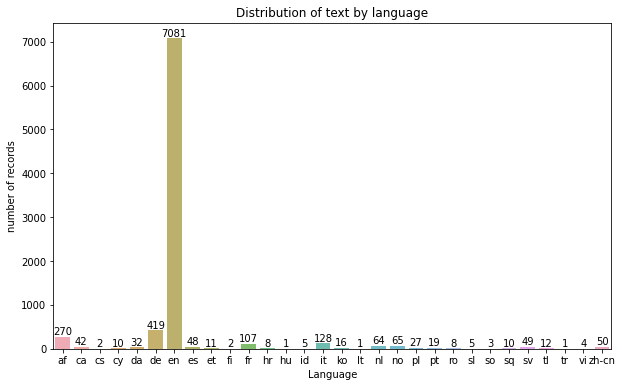

In [ ]:
x = ticket_df["language"].value_counts()
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x=x.index,y= x.values, alpha=0.8)
plt.title("Distribution of text by language")
plt.ylabel('number of records')
plt.xlabel('Language')
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show();

**Observation**

*   We can see that most of the tickets are in english, followed by tickets in German language. 
*   We need to translate these into english.



**Data Cleaning**

In [ ]:
ticket_df.head()

,Short description,Description,Caller,Assignment group,Full_Description,language
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...,en
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \n\nreceived from: hmjdrvpb.komuaywn@g...,en
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \n\nreceived from: eylqgodm...,en
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,en
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,no


Most Common words before data cleaning and removing stop words

In [ ]:
wd_counts = Counter()
for i, row in ticket_df.iterrows():
    wd_counts.update(row['Full_Description'].split())
    
wd_counts.most_common(20)

[('to', 8446),
 ('the', 7020),
 ('in', 4909),
 ('is', 3525),
 ('on', 2891),
 ('not', 2851),
 ('and', 2758),
 ('for', 2629),
 ('from:', 2499),
 ('i', 2432),
 ('received', 2371),
 ('a', 2012),
 ('job', 1975),
 ('please', 1946),
 ('password', 1865),
 ('of', 1845),
 ('erp', 1827),
 ('failed', 1700),
 ('job_scheduler', 1629),
 ('at:', 1614)]

In [ ]:
### Make text lowercase, remove text in square brackets,remove links,remove punctuation and remove words containing numbers

def clean_text(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text=text.replace(('first name: ').lower(),'firstname')
    text=text.replace(('last name: ').lower(),'lastname')
    text=text.replace(('received from:').lower(),'')
    text=text.replace('email:','')
    text=text.replace('email address:','') 
    index1=text.find('from:')
    index2=text.find('\nsddubject:')
    text=text.replace(text[index1:index2],'')
    index3=text.find('[cid:image')
    index4=text.find(']')
    text=text.replace(text[index3:index4],'')
    text=text.replace('subject:','')
    text=text.replace('received from:','')
    text=text.replace('this message was sent from an unmonitored email address', '')
    text=text.replace('please do not reply to this message', '')
    text=text.replace('monitoring_tool@company.com','MonitoringTool')
    text=text.replace('select the following link to view the disclaimer in an alternate language','')
    text=text.replace('description problem', '') 
    text=text.replace('steps taken far', '')
    text=text.replace('customer job title', '')
    text=text.replace('sales engineer contact', '')
    text=text.replace('description of problem:', '')
    text=text.replace('steps taken so far', '')
    text=text.replace('please do the needful', '')
    text=text.replace('please note that ', '')
    text=text.replace('please find below', '')
    text=text.replace('date and time', '')
    text=text.replace('kindly refer mail', '')
    text=text.replace('name:', '')
    text=text.replace('language:', '')
    text=text.replace('customer number:', '')
    text=text.replace('telephone:', '')
    text=text.replace('summary:', '')
    text=text.replace('sincerely', '')
    text=text.replace('company inc', '')
    text=text.replace('importance:', '')
    text=text.replace('gmail.com', '')
    text=text.replace('company.com', '')
    text=text.replace('microsoftonline.com', '')
    text=text.replace('company.onmicrosoft.com', '')
    text=text.replace('hello', '')
    text=text.replace('hallo', '')
    text=text.replace('hi it team', '')
    text=text.replace('hi team', '')
    text=text.replace('hi', '')
    text=text.replace('best', '')
    text=text.replace('kind', '')
    text=text.replace('regards', '')
    text=text.replace('good morning', '')
    text=text.replace('good afternoon', '')
    text=text.replace('good evening', '')
    text=text.replace('please', '')
    text=text.replace('regards', '')
    text=text.replace('NaN','')
    text=text.replace('can''t','cannot')
    text=text.replace('i''ve','i have')
    text = re.sub(r'\S+@\S+', '', text)
    #custom_punctuation='!"#$%&\'()*+,-./:;<=>?@[\\]^`{|}~'
    text = re.sub(r'\w*\d\w*', '', text)
    text = re.sub(r'\[.*?\]', '', text)
    text = re.sub(r'https?://\S+|www\.\S+', '', text)
    text = re.sub(r'<.*?>+', '', text)
    text = re.sub(r'[%s]' % re.escape(string.punctuation), ' ', text)
    text = re.sub(r'\r\n', '', text)
    text = re.sub(r'\n', '', text)
    text = re.sub(r'\S+@\S+', '', text)
    text = re.sub(r'\t', '', text)

    text = text.lower()
    return text

In [ ]:
ticket_df['cleaned_description'] = ticket_df['Full_Description'].apply(lambda x: clean_text(x))

In [ ]:
ticket_df.drop(['Full_Description'],axis=1,inplace=True)

In [ ]:
ticket_df['cleaned_description'].head()

0    login issue  verified user details  employee  ...
1    outlook  hmjdrvpb komuaywn  team my meetings s...
2    cannot log in to vpn  eylqgodm ybqkwiam i cann...
3    unable to access hr tool page unable to access...
4                            skype error  skype error 
Name: cleaned_description, dtype: object

In [ ]:
# Remove caller name from description
def replace(str1, str2):
    return str1.replace(str2, '')

ticket_df['cleaned_description'] = ticket_df.apply(lambda row: replace(row['cleaned_description'], row['Caller']), axis=1)


In [ ]:
ticket_df['cleaned_description']

0       login issue  verified user details  employee  ...
1       outlook    team my meetings skype meetings etc...
2          cannot log in to vpn   i cannot log on to vpn 
3       unable to access hr tool page unable to access...
4                               skype error  skype error 
                              ...                        
8495    emails not coming in from zz mail    i am not ...
8496    telephony software issue telephony software issue
8497      windows password reset for tifpdchb pedxruyf...
8498    macne não está funcionando i am unable to acce...
8499    an mehreren pc s lassen sich verscedene prgram...
Name: cleaned_description, Length: 8500, dtype: object

In [ ]:
from collections import OrderedDict
ticket_df['cleaned_description'] = (ticket_df['cleaned_description'].str.split()
                              .apply(lambda x: OrderedDict.fromkeys(x).keys())
                              .str.join(' '))

In [ ]:
ticket_df['cleaned_description'].head()

0    login issue verified user details employee man...
1    outlook team my meetings skype etc are not app...
2                            cannot log in to vpn i on
3                        unable to access hr tool page
4                                          skype error
Name: cleaned_description, dtype: object

In [ ]:
wd_counts = Counter()
for i, row in ticket_df.iterrows():
    wd_counts.update(row['cleaned_description'].split())
    
wd_counts.most_common(20)

[('to', 3199),
 ('in', 2752),
 ('the', 2438),
 ('is', 1867),
 ('not', 1670),
 ('on', 1559),
 ('and', 1477),
 ('for', 1431),
 ('at', 1430),
 ('i', 1287),
 ('a', 1117),
 ('it', 1080),
 ('erp', 1053),
 ('password', 1029),
 ('have', 1021),
 ('job', 1007),
 ('of', 996),
 ('scheduler', 968),
 ('tool', 882),
 ('failed', 877)]

In [ ]:
uni_df_with_stopw = pd.DataFrame(wd_counts.most_common(20), columns =['Words', 'Count'])

In [ ]:
uni_df_with_stopw

,Words,Count
0,to,3199
1,in,2752
2,the,2438
3,is,1867
4,not,1670
5,on,1559
6,and,1477
7,for,1431
8,at,1430
9,i,1287


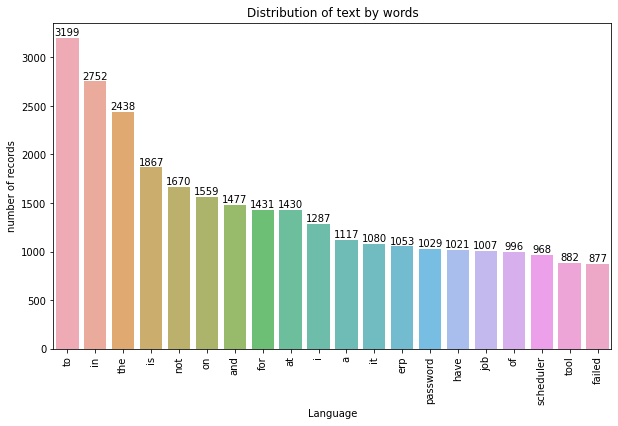

In [ ]:
x = uni_df_with_stopw
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x=x.Words, y=x.Count, alpha=0.8)
plt.title("Distribution of text by words")
plt.ylabel('number of records')
plt.xlabel('Language')
plt.xticks(rotation=90)
rects = ax.patches
labels = x.Count
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show();

Need to remove stop words and unnecessary words that do not add meaning to the content.

**Remove stop words**

In [ ]:
stop = stopwords.words('english')
ticket_df['cleaned_description'] = ticket_df['cleaned_description'].apply(lambda x: " ".join(x for x in str(x).split() if x not in stop))
ticket_df['cleaned_description'].head()

0    login issue verified user details employee man...
1    outlook team meetings skype etc appearing cale...
2                                       cannot log vpn
3                           unable access hr tool page
4                                          skype error
Name: cleaned_description, dtype: object

**Lemmatization**

In [ ]:
## Lemmatization
ticket_df['cleaned_description']= ticket_df['cleaned_description'].apply(lambda x: " ".join([Word(word).lemmatize() for word in str(x).split()]))
ticket_df['cleaned_description'].head()

0    login issue verified user detail employee mana...
1    outlook team meeting skype etc appearing calen...
2                                       cannot log vpn
3                           unable access hr tool page
4                                          skype error
Name: cleaned_description, dtype: object

In [ ]:
wd_counts = Counter()
for i, row in ticket_df.iterrows():
    wd_counts.update(row['cleaned_description'].split())
    
wd_counts.most_common(20)

[('password', 1176),
 ('erp', 1053),
 ('job', 1029),
 ('scheduler', 968),
 ('issue', 960),
 ('tool', 937),
 ('failed', 877),
 ('unable', 871),
 ('reset', 855),
 ('t', 810),
 ('user', 808),
 ('monitoringtooljob', 785),
 ('access', 679),
 ('error', 673),
 ('account', 660),
 ('need', 659),
 ('working', 608),
 ('company', 604),
 ('help', 559),
 ('email', 550)]

In [ ]:
uni_df = pd.DataFrame(wd_counts.most_common(20), columns =['Words', 'Count'])

In [ ]:
uni_df

,Words,Count
0,password,1176
1,erp,1053
2,job,1029
3,scheduler,968
4,issue,960
5,tool,937
6,failed,877
7,unable,871
8,reset,855
9,t,810


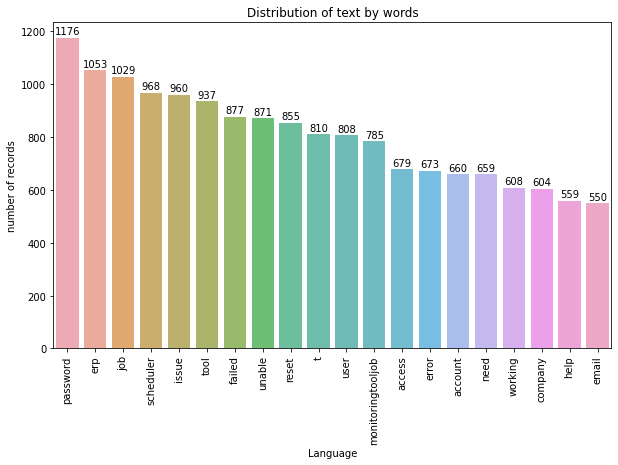

In [ ]:
x = uni_df
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x=x.Words, y=x.Count, alpha=0.8)
plt.title("Distribution of text by words")
plt.ylabel('number of records')
plt.xlabel('Language')
plt.xticks(rotation=90)
rects = ax.patches
labels = x.Count
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show();

**Observations**

*   Before cleaning data and removing stop words the data had common words as articals, consconants, prepositions. etc
*   After cleaning the common words now look like words that would help in predicting.



In [ ]:
ticket_df['descr_len'] = ticket_df['cleaned_description'].apply(lambda x: len(x))
ticket_df['descr_len'].mean()

86.72976470588236

In [ ]:
print(ticket_df['descr_len'].max())
print(ticket_df['descr_len'].min())

3150
0


In [ ]:
ticket_df['num_wds'] = ticket_df['cleaned_description'].apply(lambda x: len(x.split()))
ticket_df['num_wds'].mean()

12.17635294117647

In [ ]:
ticket_df['num_wds'].describe()

count    8500.000000
mean       12.176353
std        18.091077
min         0.000000
25%         4.000000
50%         7.000000
75%        15.000000
max       428.000000
Name: num_wds, dtype: float64

In [ ]:
len(ticket_df[ticket_df['num_wds']==0])

2

**Drop tickets with just one word in Description**

In [ ]:
ticket_df= ticket_df[ticket_df['num_wds']>1]

In [ ]:
print(ticket_df['num_wds'].min())

2


In [ ]:
def avg_word(sentence):
  words = sentence.split()
  return (sum(len(word) for word in words)/len(words))


ticket_df['avg_word'] = ticket_df['cleaned_description'].apply(lambda x: avg_word(str(x)))
ticket_df.head()

,Short description,Description,Caller,Assignment group,language,cleaned_description,descr_len,num_wds,avg_word
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,en,login issue verified user detail employee mana...,125,18,6.000000
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,en,outlook team meeting skype etc appearing calen...,75,11,5.909091
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,en,cannot log vpn,14,3,4.000000
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,en,unable access hr tool page,26,5,4.400000
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,no,skype error,11,2,5.000000


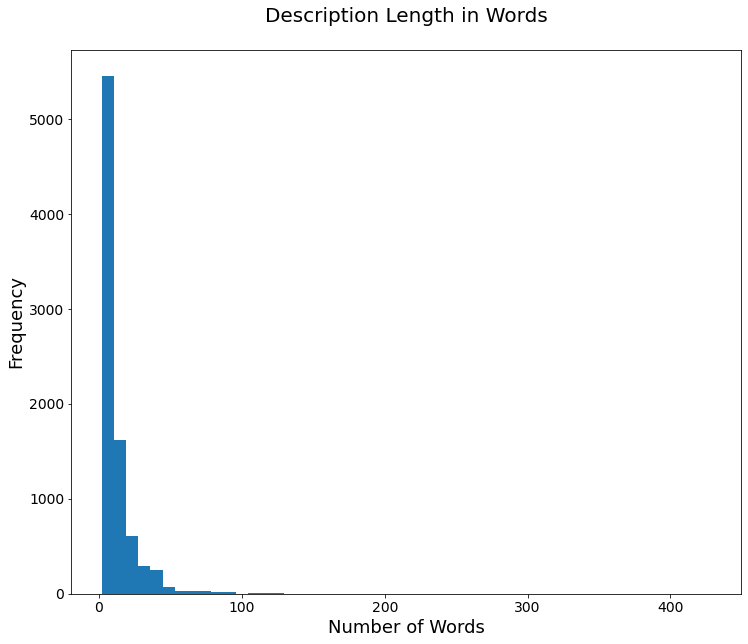

In [ ]:
ax=ticket_df['num_wds'].plot(kind='hist', bins=50, fontsize=14, figsize=(12,10))
ax.set_title('Description Length in Words\n', fontsize=20)
ax.set_ylabel('Frequency', fontsize=18)
ax.set_xlabel('Number of Words', fontsize=18);

In [ ]:
ticket_df['uniq_wds'] = ticket_df['cleaned_description'].str.split().apply(lambda x: len(set(x)))
ticket_df['uniq_wds'].head()

0    18
1    11
2     3
3     5
4     2
Name: uniq_wds, dtype: int64

In [ ]:
ticket_df['uniq_wds'].describe()

count    8457.000000
mean       12.107958
std        17.674118
min         2.000000
25%         4.000000
50%         7.000000
75%        15.000000
max       415.000000
Name: uniq_wds, dtype: float64

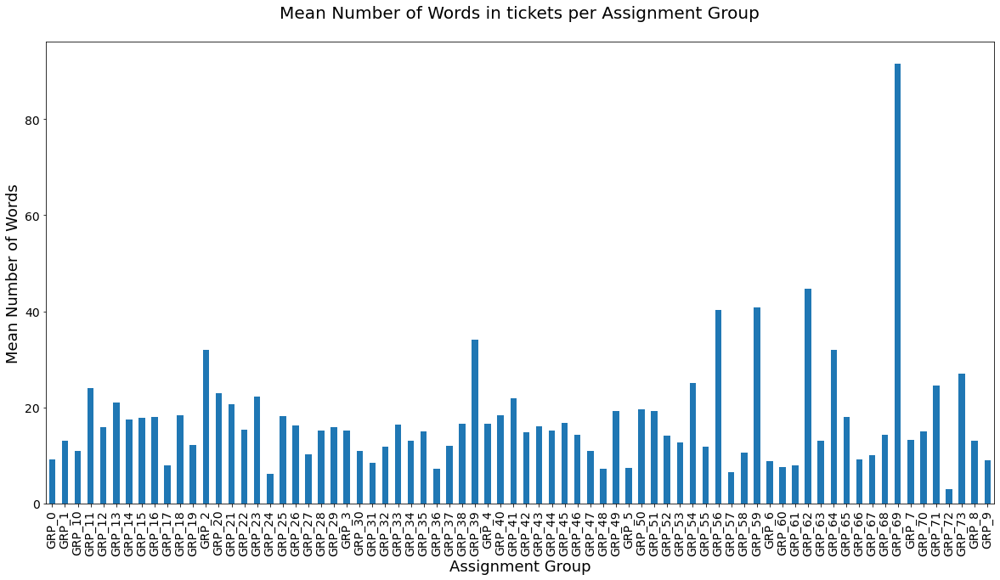

In [ ]:
assign_grps = ticket_df.groupby('Assignment group')
ax=assign_grps['num_wds'].aggregate(np.mean).plot(kind='bar', fontsize=14, figsize=(20,10))
ax.set_title('Mean Number of Words in tickets per Assignment Group\n', fontsize=20)
ax.set_ylabel('Mean Number of Words', fontsize=18)
ax.set_xlabel('Assignment Group', fontsize=18);

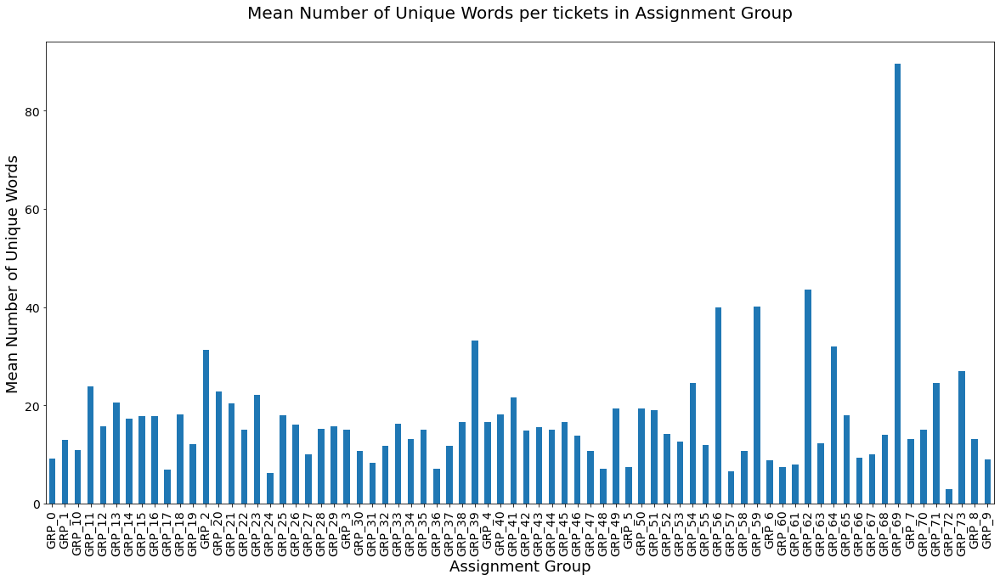

In [ ]:
ax=assign_grps['uniq_wds'].aggregate(np.mean).plot(kind='bar', fontsize=14, figsize=(20,10))
ax.set_title('Mean Number of Unique Words per tickets in Assignment Group\n', fontsize=20)
ax.set_ylabel('Mean Number of Unique Words', fontsize=18)
ax.set_xlabel('Assignment Group', fontsize=18);

**Observations**

*   Group-56 has the highest amount of words but group-69 has the highest amount of unique words. 
*   Thus it means the group wth highest words doesnt necessarily have to contain meaningfull content. Also means there are more redundant words in them.



**Tokenization**

In [ ]:
tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')
ticket_df['tokenized_desc'] = ticket_df['cleaned_description'].apply(lambda x: tokenizer.tokenize(x))

In [ ]:
ticket_df['tokenized_desc'].head()

0    [login, issue, verified, user, detail, employe...
1    [outlook, team, meeting, skype, etc, appearing...
2                                   [cannot, log, vpn]
3                     [unable, access, hr, tool, page]
4                                       [skype, error]
Name: tokenized_desc, dtype: object

In [ ]:
def combine_text(list_of_text):
    combined_text = ' '.join(list_of_text)
    return combined_text

ticket_df['tokenized_desc'] = ticket_df['tokenized_desc'].apply(lambda x : combine_text(x))

In [ ]:
ticket_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8457 entries, 0 to 8499
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Short description    8457 non-null   object 
 1   Description          8457 non-null   object 
 2   Caller               8457 non-null   object 
 3   Assignment group     8457 non-null   object 
 4   language             8457 non-null   object 
 5   cleaned_description  8457 non-null   object 
 6   descr_len            8457 non-null   int64  
 7   num_wds              8457 non-null   int64  
 8   avg_word             8457 non-null   float64
 9   uniq_wds             8457 non-null   int64  
 10  tokenized_desc       8457 non-null   object 
dtypes: float64(1), int64(3), object(7)
memory usage: 792.8+ KB


In [ ]:
ticket_df.head()

,Short description,Description,Caller,Assignment group,language,cleaned_description,descr_len,num_wds,avg_word,uniq_wds,tokenized_desc
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,en,login issue verified user detail employee mana...,125,18,6.000000,18,login issue verified user detail employee mana...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,en,outlook team meeting skype etc appearing calen...,75,11,5.909091,11,outlook team meeting skype etc appearing calen...
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,en,cannot log vpn,14,3,4.000000,3,cannot log vpn
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,en,unable access hr tool page,26,5,4.400000,5,unable access hr tool page
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,no,skype error,11,2,5.000000,2,skype error


**Visualize percentage of tickets per assignment group**

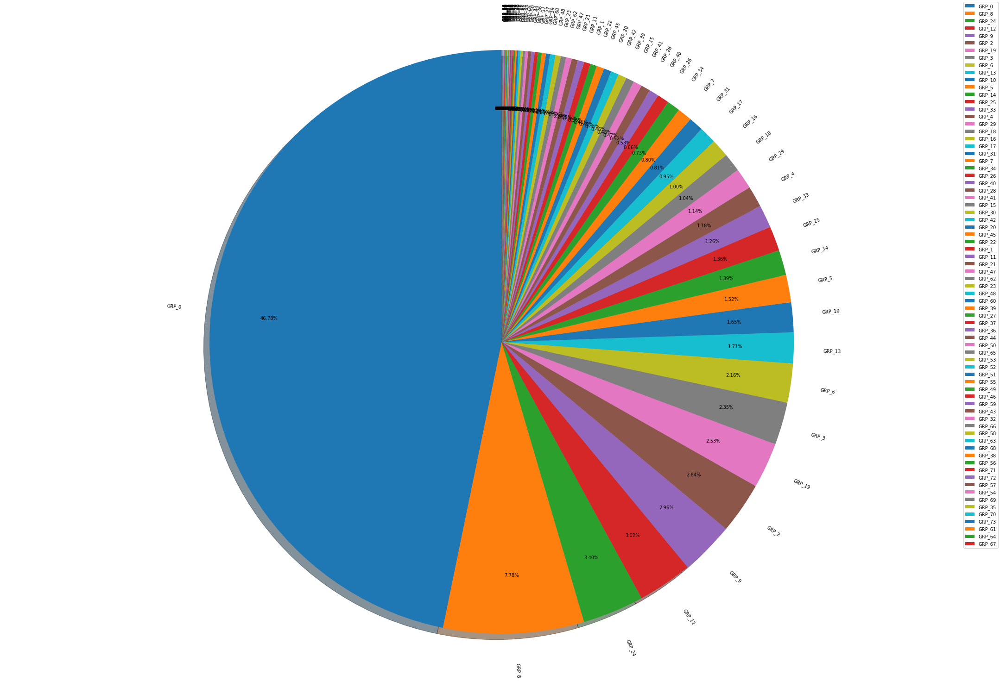

In [ ]:
# Pie chart
fig1, ax1 = plt.subplots(figsize=(30, 20))
ax1.pie(tkt_df['percentage'], labels=tkt_df['index'], labeldistance=1.1, pctdistance=0.8, rotatelabels=90, autopct='%.2f%%', shadow=True, startangle=90)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
fig1.legend(loc=0, prop={'size': 10})
plt.tight_layout()
plt.show()

Interactive plot

In [ ]:
configure_plotly_browser_state()

# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', ticket_df['Assignment group'].nunique())

# Histogram
# ticket_df['Assignment group'].iplot(kind='hist', title='Assignment Group Distribution- Histogram')

# Pie chart
assgn_grp = pd.DataFrame(ticket_df.groupby('Assignment group').size(),columns = ['Count']).reset_index()
assgn_grp.iplot(kind='pie', labels='Assignment group', values='Count', title='Assignment Group Distribution', hoverinfo="label+percent+name", hole=0.25)

Total assignment groups: 74


**Pareto Chart**

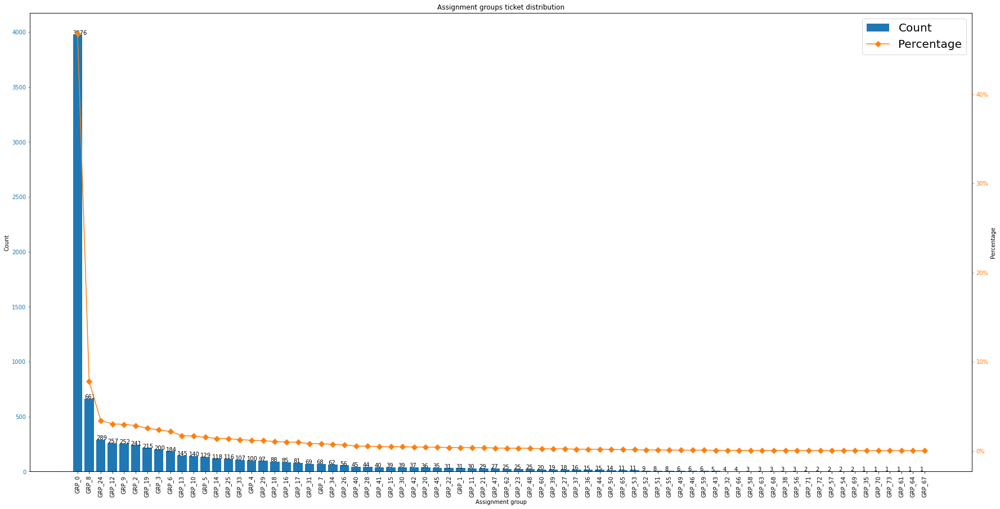

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(30, 15))
bars = ax.bar(tkt_df['index'], tkt_df['Assignment group'], color="C0", label = 'Count')
plt.xticks(rotation=90)
ax2 = ax.twinx()
ax2.plot(tkt_df.index, tkt_df["percentage"], color="C1", marker="D", ms=7, label = 'Percentage')
ax2.yaxis.set_major_formatter(PercentFormatter())

ax.tick_params(axis="y", colors="C0")
ax2.tick_params(axis="y", colors="C1")
lines_1, labels_1 = ax.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()

lines = lines_1 + lines_2
labels = labels_1 + labels_2

ax.legend(lines, labels, loc=0, prop={'size': 20})

ax.set_xlabel("Assignment group")
ax.set_ylabel("Count")
ax2.set_ylabel("Percentage")

plt.title('Assignment groups ticket distribution')

for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x(), yval + .005, yval)
plt.show()

**Observations**  


*   The data is highly skewed with 46.77% of the tickets present in the Group 0 followed by Group 8, 24, 12, 9, 2, 19
*   There are few Groups with less than 10 tickets and few with just 1 or 2 tickets. Have to consider dropping such tickets due to lack of sufficient data for prediction.



**Top 20 Assignment groups with highest number of tickets**

In [ ]:
top_20_df = ticket_df['Assignment group'].value_counts().nlargest(20).reset_index()
top_20_df

,index,Assignment group
0,GRP_0,3956
1,GRP_8,660
2,GRP_24,277
3,GRP_12,257
4,GRP_9,252
5,GRP_2,241
6,GRP_19,215
7,GRP_3,198
8,GRP_6,182
9,GRP_13,145


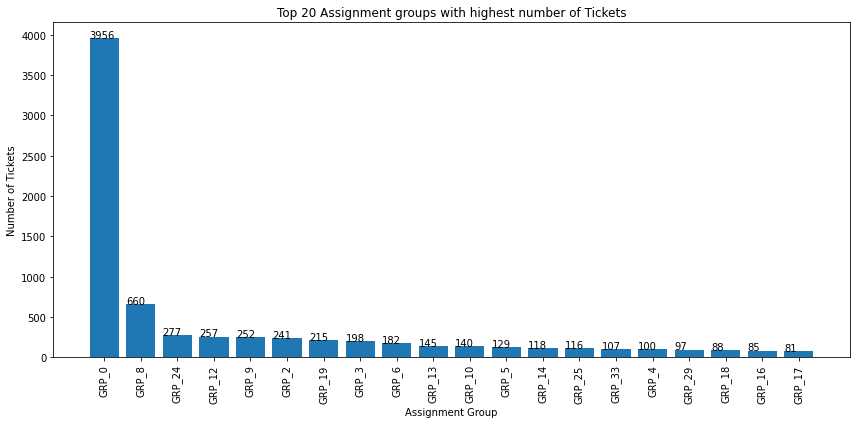

In [ ]:
plt.figure(figsize=(12,6))
bars = plt.bar(top_20_df['index'],top_20_df['Assignment group'])
plt.title('Top 20 Assignment groups with highest number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

**Bottom 20 Assignment groups with lowest number of tickets**

In [ ]:
bottom_20_df = ticket_df['Assignment group'].value_counts().nsmallest(20).reset_index()
bottom_20_df

,index,Assignment group
0,GRP_35,1
1,GRP_70,1
2,GRP_73,1
3,GRP_61,1
4,GRP_64,1
5,GRP_67,1
6,GRP_71,2
7,GRP_72,2
8,GRP_57,2
9,GRP_54,2


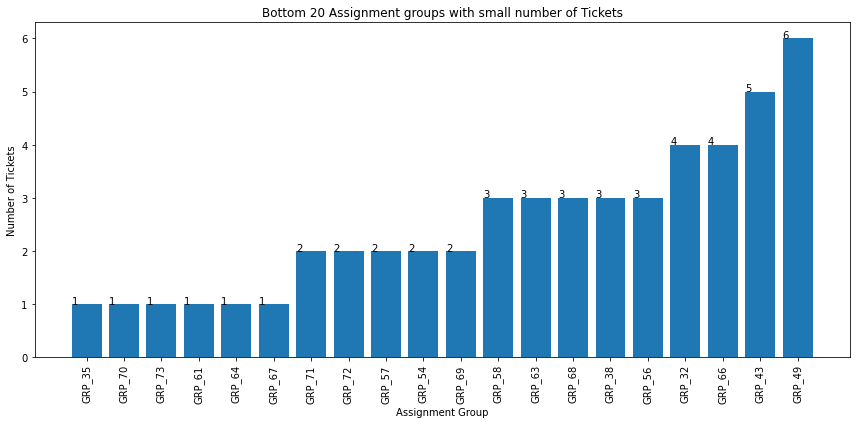

In [ ]:
plt.figure(figsize=(12,6))
bars = plt.bar(bottom_20_df['index'],bottom_20_df['Assignment group'])
plt.title('Bottom 20 Assignment groups with small number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

**Distribution of tickets within groups less than 30 tickets**

In [ ]:
# Find out the Assignment Groups with less than equal to 30 tickets assigned
rare_ticket_df = ticket_df.groupby(['Assignment group']).filter(lambda x: len(x) <= 30)
print('Groups with less than equal to 30 tickets assigned:', rare_ticket_df['Assignment group'].nunique())

configure_plotly_browser_state()
rare_ticket_df['Assignment group'].iplot(kind='hist', xTitle='Assignment Group', yTitle='count', colorscale='-orrd', title='Records by rare Assignment Groups- Histogram')

plt.show()

Groups with less than equal to 30 tickets assigned: 40


In [ ]:
df_range = pd.DataFrame(columns=['Range','Group_count'])
one_ticket = {'Range':'1 ticket','Group_count':len(tkt_df[tkt_df['Assignment group'] < 2])}
_2_5_ticket = {'Range':'2-5 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 1)& (tkt_df['Assignment group'] < 6) ])}
_10_ticket = {'Range':' 6-10 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 5)& (tkt_df['Assignment group'] < 11)])}
_10_20_ticket = {'Range':' 11-20 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 10)& (tkt_df['Assignment group'] < 21)])}
_20_50_ticket = {'Range':' 21-50 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 20)& (tkt_df['Assignment group'] < 51)])}
_51_100_ticket = {'Range':' 51-100 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 50)& (tkt_df['Assignment group'] < 101)])}
_100_ticket = {'Range':' >100 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 100)])}
#append row to the dataframe
df_range = df_range.append([one_ticket,_2_5_ticket,_10_ticket,
                          _10_20_ticket,_20_50_ticket,_51_100_ticket,_100_ticket], ignore_index=True)

df_range

,Range,Group_count
0,1 ticket,6
1,2-5 ticket,13
2,6-10 ticket,6
3,11-20 ticket,9
4,21-50 ticket,16
5,51-100 ticket,9
6,>100 ticket,15


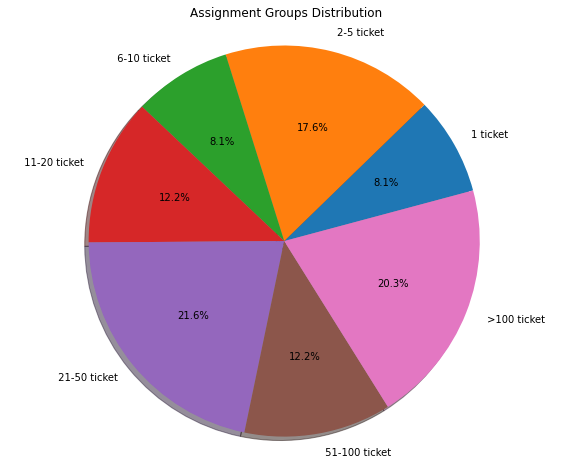

In [ ]:
plt.figure(figsize=(10, 8))
plt.pie(df_range['Group_count'],labels=df_range['Range'],autopct='%1.1f%%', startangle=15, shadow = True);
plt.title('Assignment Groups Distribution')
plt.axis('equal');

**Observations**

*   Top 5 groups with hightest tickets are - 0, 8, 24, 12, 9
*   Bottom 5 groups with lowest tickets are - 70, 64, 67, 73, 35
*   There are 40 groups with just 30 or less tickets assigned, amongst which 6 groups happened to be assigned with just 1 ticket, 4 groups with just 2 tickets each and 5 groups with 3 tickets each.
*   There are 15 assignment groups that has more than 100 tickets which accounts to only 20.3% of the overall dataset.







In [ ]:
ticket_df.head()

,Short description,Description,Caller,Assignment group,language,cleaned_description,descr_len,num_wds,avg_word,uniq_wds,tokenized_desc
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,en,login issue verified user detail employee mana...,125,18,6.000000,18,login issue verified user detail employee mana...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,en,outlook team meeting skype etc appearing calen...,75,11,5.909091,11,outlook team meeting skype etc appearing calen...
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,en,cannot log vpn,14,3,4.000000,3,cannot log vpn
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,en,unable access hr tool page,26,5,4.400000,5,unable access hr tool page
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,no,skype error,11,2,5.000000,2,skype error


**Drop groups that has just one ticket each**

In [ ]:
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_73')].index , inplace=True)
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_60')].index , inplace=True)
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_35')].index , inplace=True)
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_70')].index , inplace=True)
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_64')].index , inplace=True)
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_67')].index , inplace=True)

In [ ]:
ticket_df.shape

(8432, 11)

In [ ]:
ticket_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8432 entries, 0 to 8499
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Short description    8432 non-null   object 
 1   Description          8432 non-null   object 
 2   Caller               8432 non-null   object 
 3   Assignment group     8432 non-null   object 
 4   language             8432 non-null   object 
 5   cleaned_description  8432 non-null   object 
 6   descr_len            8432 non-null   int64  
 7   num_wds              8432 non-null   int64  
 8   avg_word             8432 non-null   float64
 9   uniq_wds             8432 non-null   int64  
 10  tokenized_desc       8432 non-null   object 
dtypes: float64(1), int64(3), object(7)
memory usage: 790.5+ KB


### **Word Cloud**

In [ ]:
def f_word_cloud(column):
    
    comment_words = ' '
    stopwords = set(STOPWORDS)

    # iterate through the csv file 
    for val in column: 

        # typecaste each val to string 
        val = str(val) 

        # split the value 
        tokens = val.split() 

        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 

        for words in tokens: 
            comment_words = comment_words + words + ' '


    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(comment_words) 
    
    return wordcloud

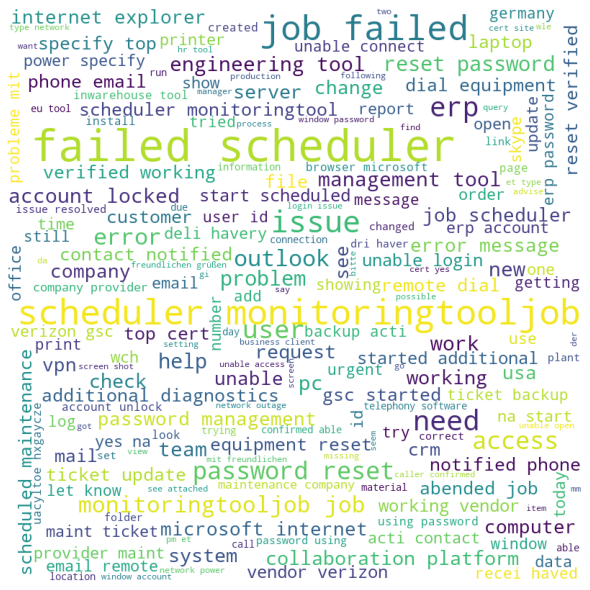

In [ ]:
wordcloud = f_word_cloud(ticket_df.cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

**Top 4 Group word cloud to understand the group's field of operation**

**Group 0**

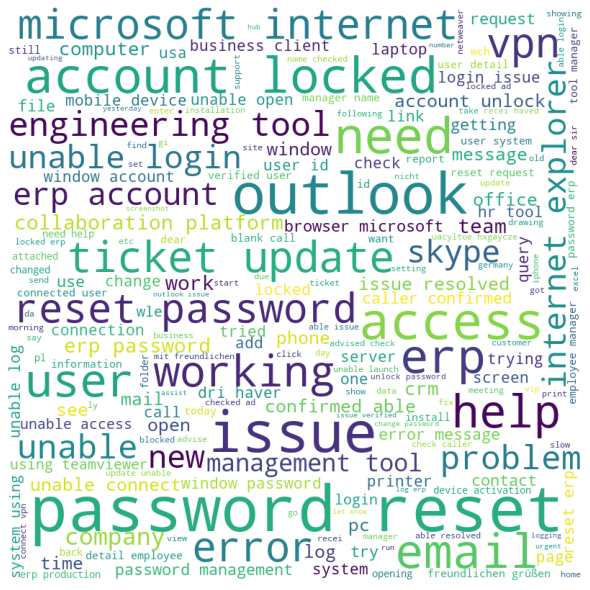

In [ ]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Assignment group']=='GRP_0'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [ ]:
ticket_df[ticket_df["cleaned_description"].str.contains("account lock")]["Assignment group"].value_counts()

GRP_0     242
GRP_2       5
GRP_14      1
GRP_31      1
GRP_72      1
GRP_1       1
GRP_34      1
Name: Assignment group, dtype: int64

In [ ]:
ticket_df[ticket_df["cleaned_description"].str.contains("password reset")]["Assignment group"].value_counts()

GRP_0     343
GRP_2       5
GRP_7       2
GRP_12      1
Name: Assignment group, dtype: int64

**Observations**

*   Group 0 seems to have ticket issue related to password resert, access issues , login issue, etc. Seem to be an L1 category issues to be resolved.
*   Groups that have similar common words as group-0 are group- 2,7,12,14,17 etc.




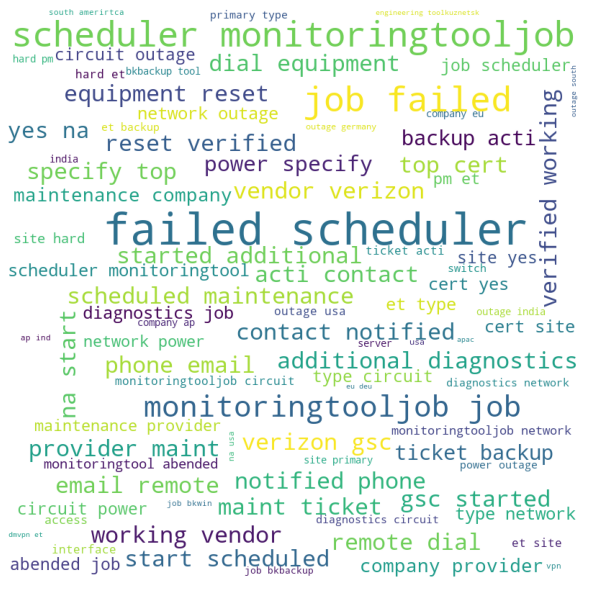

In [ ]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Assignment group']=='GRP_8'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [ ]:
ticket_df[ticket_df["cleaned_description"].str.contains("jobscheduler")]["Assignment group"].value_counts()

Series([], Name: Assignment group, dtype: int64)

In [ ]:
ticket_df[ticket_df["cleaned_description"].str.contains("outage")]["Assignment group"].value_counts()

GRP_8     141
GRP_4      17
GRP_0      10
GRP_16      1
GRP_37      1
Name: Assignment group, dtype: int64

**Observations**

*   Group 8 have issues related to monitoring tool, scheduled maintenance, outage, job failure, etc.
*   These issues seems to be of higher priority and thus it cam be assumed to be L3 related issue.
*   Groups that has similar ticket issue key words as that of group 8 are group-9,6,5,10,4,47,0,45,12,1,13,14,29,18 etc.

We find that the similar groups in group 0 and 8 do not overlap and can see clear distinction in the type of field and level of work









**Comparison between Group-0(L1/L2) and Group-8(L3)**

In [ ]:
ticket_df_level = ticket_df.copy()
ticket_df_level['Target'] = np.where(ticket_df_level['Assignment group']=='GRP_0','L1/L2',np.where(ticket_df_level['Assignment group'] =='GRP_8','L1/L2','L3'))

Text(0, 0.5, 'tickets')

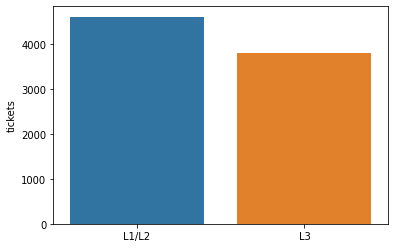

In [ ]:
x=ticket_df_level.Target.value_counts()
sns.barplot(x.index,x)
plt.gca().set_ylabel('tickets')

**Observations** - L1/L2 type ticket counts are quiet higher than L3 tickets in the dataset

**Group-12**

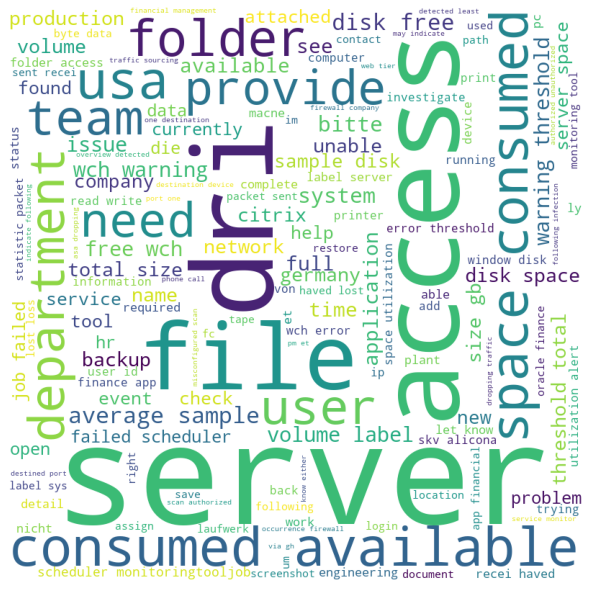

In [ ]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Assignment group']=='GRP_12'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

**Observations** - Group-12 tickets mostly revolve around server, asa deny, dst outside, outside access.

**Group-24**

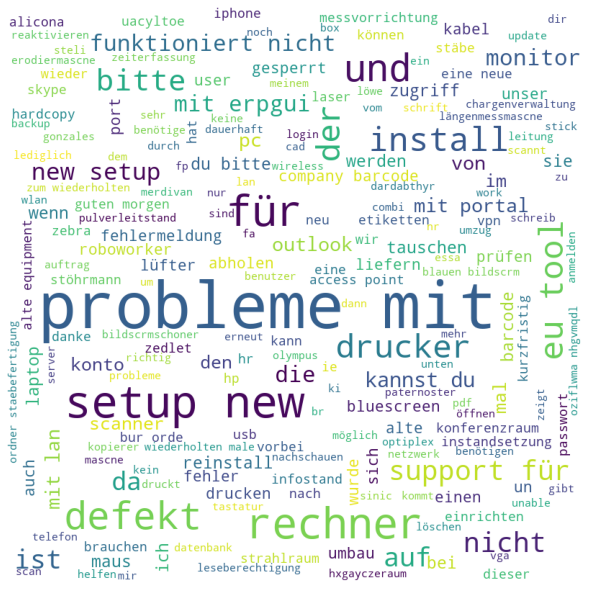

In [ ]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Assignment group']=='GRP_24'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

**Observations** - Group-24 consist of german language which needs translation

### **Caller Distribution Analysis**

In [ ]:
len(ticket_df['Caller'].unique())

2942

In [ ]:
ticket_df.groupby("Caller").size()

Caller
DEsowkrH sciejzNE      2
HdOuWxAt qfKdlJMx      1
ZkBogxib QsEJzdZO    151
abiuclvj brziktno      1
abtknpew ifcekjdb      1
                    ... 
zylaexnv pvkzbduh      3
zylwdbig wdkbztjp      1
zymdwqsi jzvbthil      1
zywoxerf paqxtrfk      9
zyxjagro vjgozhpn      2
Length: 2942, dtype: int64

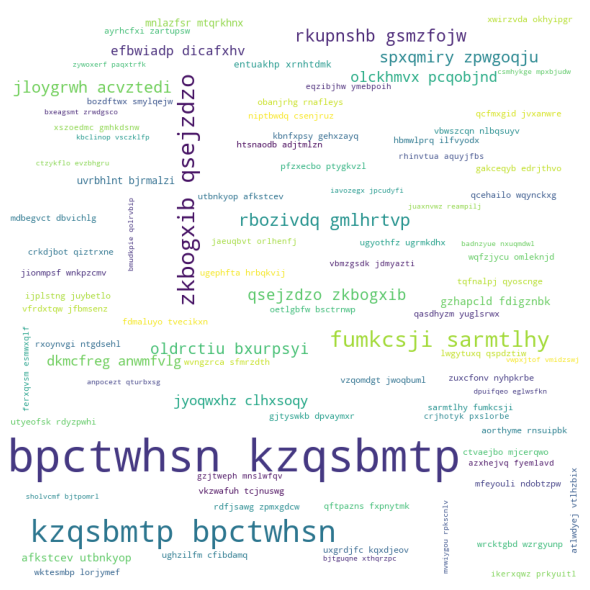

In [ ]:
wordcloud = f_word_cloud(ticket_df.Caller)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [ ]:
fig1 = px.histogram(ticket_df, x="Caller")
HTML(fig1.to_html())

In [ ]:
top_10_caller_df = ticket_df['Caller'].value_counts().nlargest(10).reset_index()
top_10_caller_df

,index,Caller
0,bpctwhsn kzqsbmtp,794
1,ZkBogxib QsEJzdZO,151
2,fumkcsji sarmtlhy,134
3,rbozivdq gmlhrtvp,79
4,rkupnshb gsmzfojw,71
5,jloygrwh acvztedi,62
6,spxqmiry zpwgoqju,62
7,oldrctiu bxurpsyi,57
8,olckhmvx pcqobjnd,54
9,dkmcfreg anwmfvlg,51


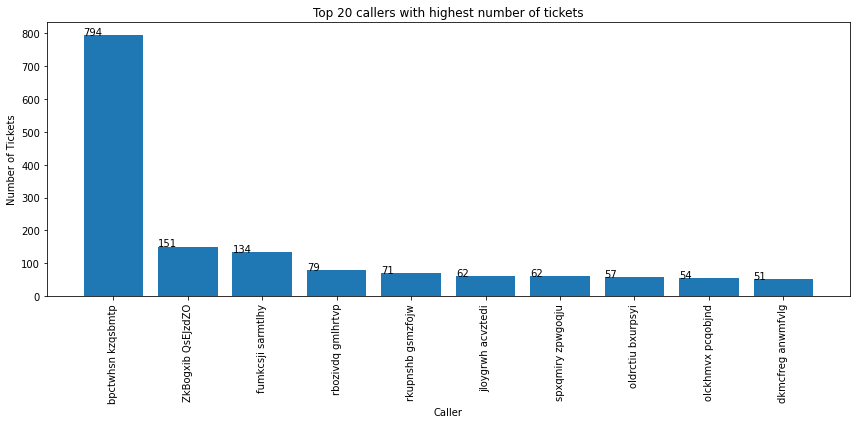

In [ ]:
plt.figure(figsize=(12,6))
bars = plt.bar(top_10_caller_df['index'],top_10_caller_df['Caller'])
plt.title('Top 20 callers with highest number of tickets')
plt.xlabel('Caller')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

**Top 4 caller word cloud**

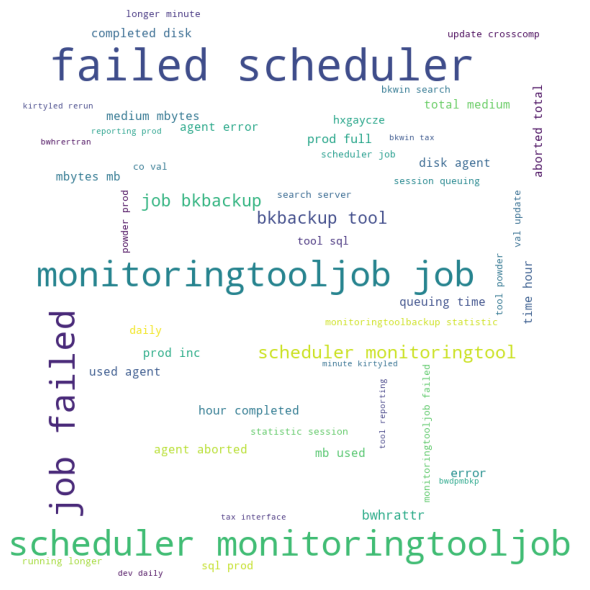

In [ ]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Caller']=='bpctwhsn kzqsbmtp'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

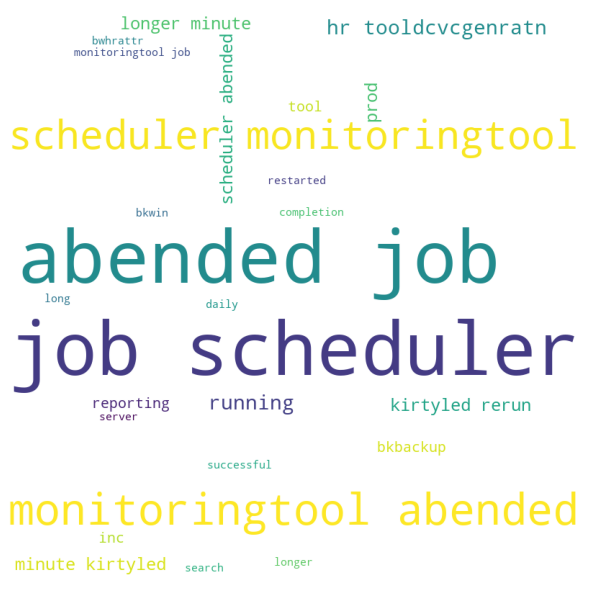

In [ ]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Caller']=='ZkBogxib QsEJzdZO'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

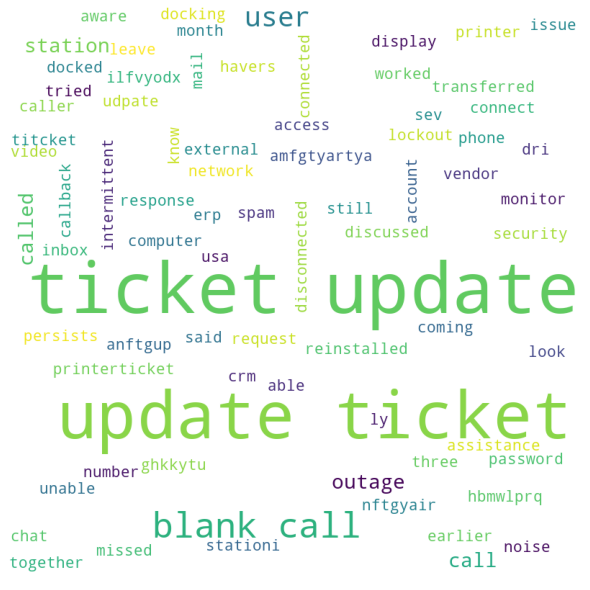

In [ ]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Caller']=='fumkcsji sarmtlhy'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

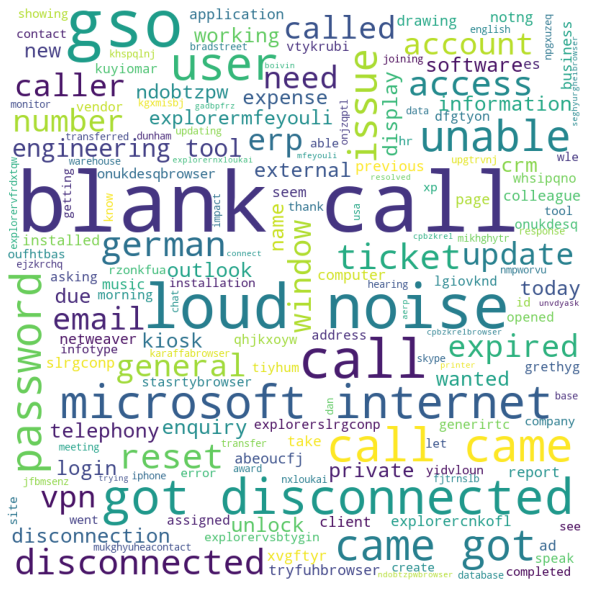

In [ ]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Caller']=='rbozivdq gmlhrtvp'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

**Observations**

*   The top caller "bpctwhsn kzqsbmtp" & "ZkBogxib QsEJzdZO" mostly addresses issues related to job_scheduler, monitoring tool.
*   Caller "fumkcsji sarmtlhy" tickets are related to ticket updates and specific ticket related issues.
*   Caller "rbozivdq gmlhrtvp" are mostly related to basic front desk resolvable issues such as loud noise, general enquiry, loud noise etc.

In [ ]:
# Top 5 callers in each assignment group
top_n = 5
s = ticket_df['Caller'].groupby(ticket_df['Assignment group']).value_counts()
caller_grp = pd.DataFrame(s.groupby(level=0).nlargest(top_n).reset_index(level=0, drop=True))
caller_grp.head(15)

Caller
Assignment group Caller                   
GRP_0            fumkcsji sarmtlhy     132
                 rbozivdq gmlhrtvp      78
                 olckhmvx pcqobjnd      54
                 efbwiadp dicafxhv      45
                 mfeyouli ndobtzpw      13
GRP_1            bpctwhsn kzqsbmtp       6
                 jloygrwh acvztedi       4
                 jyoqwxhz clhxsoqy       3
                 spxqmiry zpwgoqju       3
                 kbnfxpsy gehxzayq       2
GRP_10           bpctwhsn kzqsbmtp      60
                 ihfkwzjd erbxoyqk       6
                 dizquolf hlykecxa       5
                 gnasmtvx cwxtsvkm       3
                 hlrmufzx qcdzierm       3

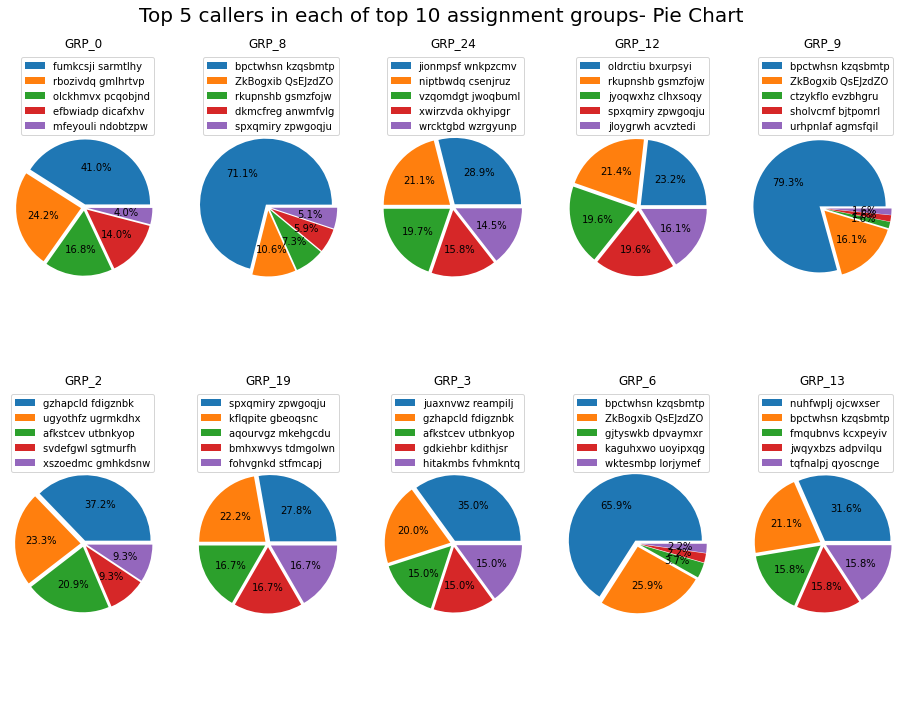

In [ ]:
# Visualize Top 5 callers in each of top 10 assignment groups
top_n = 10 
top_grps = assgn_grp.nlargest(top_n, 'Count')['Assignment group'].tolist()

fig_cols = 5
fig_rows = int(np.ceil(top_n/fig_cols))
fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(13,9.5))
fig.suptitle('Top 5 callers in each of top 10 assignment groups- Pie Chart', y=1, va= 'bottom', size='20')
for row in range(fig_rows):
    for col in range(fig_cols):
        grp_n = fig_cols * row + col
        if grp_n < top_n:
            xs = caller_grp.xs(top_grps[grp_n])
            _ = axes[row,col].pie(xs, autopct='%1.1f%%', explode=[0.05]*5)
            axes[row,col].legend(labels=xs.index,loc="best")
            axes[row,col].axis('equal')
            axes[row,col].set_title(top_grps[grp_n])

plt.tight_layout()

In [ ]:
# Check if any caller appears to raise ticket for multiple groups
mul_caller = caller_grp[caller_grp.Caller.duplicated()]
uni_mul_caller = [idx[1] for idx in mul_caller.index[mul_caller.Caller.unique()]]
print(f'\033[1mFollowing {len(uni_mul_caller)} callers happen to raise tickets for multiple groups:\033[0m\n')
print(uni_mul_caller)

mul_caller

Following 16 callers happen to raise tickets for multiple groups:

['hlrmufzx qcdzierm', 'fbgetczn jlsvxura', 'gnasmtvx cwxtsvkm', 'ihfkwzjd erbxoyqk', 'tqfnalpj qyoscnge', 'fmqubnvs kcxpeyiv', 'tghrloks jbgcvlmf', 'jwqyxbzs adpvilqu', 'nuhfwplj ojcwxser', 'oldrctiu bxurpsyi', 'vlymsnej whlqxcst', 'dkmcfreg anwmfvlg', 'bpctwhsn kzqsbmtp', 'lmsxcvoz vzhkdpfn', 'spxqmiry zpwgoqju', 'obanjrhg rnafleys']


Caller
Assignment group Caller                   
GRP_1            spxqmiry zpwgoqju       3
GRP_10           ihfkwzjd erbxoyqk       6
                 gnasmtvx cwxtsvkm       3
                 hlrmufzx qcdzierm       3
GRP_11           tghrloks jbgcvlmf       2
...                                    ...
GRP_72           ydigzqbu xdgjizek       1
GRP_8            ZkBogxib QsEJzdZO      54
GRP_9            ctzykflo evzbhgru       3
                 sholvcmf bjtpomrl       3
                 urhpnlaf agmsfqil       3

[273 rows x 1 columns]

**Observations**

*   There are overall 2950 callers in the dataset.
*   15 callers are involved in raising tickets for multiple assignment group, overall contributing to 281 tickets in the dataset.
*   The top 5 caller ticket distribution in every group is widely distributed almost having a balanced distribution. This indicated that most of the group resolves issues widely over various field impacting business

# **Data Pre-Processing**

### **N-Grams**

**Uni-Gram**

In [ ]:
def get_top_n_words(corpus, range=(1,1), n=None):
    vec = CountVectorizer(ngram_range=range, stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]


common_words = get_top_n_words(ticket_df['cleaned_description'], (1,1),20)
for word, freq in common_words:
    print(word, freq)

password 1176
erp 1052
job 1016
issue 957
scheduler 955
tool 933
unable 868
failed 863
reset 855
user 808
monitoringtooljob 772
access 677
error 673
account 660
need 658
working 607
company 602
help 558
email 548
ticket 528


**Bi-Grams**

In [ ]:
# The distribution of top bigrams after removing stop words for Complete_Description

common_words = get_top_n_words(ticket_df['cleaned_description'], (2,2),20)
for word, freq in common_words:
    print(word, freq)

failed scheduler 796
scheduler monitoringtooljob 768
job failed 734
password reset 351
reset password 241
engineering tool 212
management tool 209
account locked 208
collaboration platform 181
microsoft internet 166
password management 165
job scheduler 159
internet explorer 156
error message 156
scheduler monitoringtool 155
ticket update 153
abended job 151
phone email 147
specify cert 143
scheduled maintenance 143


**Tri-Grams**

In [ ]:
# The distribution of top trigrams after removing stop words for Complete_Description

common_words = get_top_n_words(ticket_df['cleaned_description'], (3,3) ,20)
for word, freq in common_words:
    print(word, freq)

failed scheduler monitoringtooljob 768
job failed scheduler 733
password management tool 159
abended job scheduler 151
contact notified phone 143
notified phone email 143
remote dial equipment 143
dial equipment reset 143
equipment reset verified 143
reset verified working 143
verified working vendor 142
working vendor verizon 142
gsc started additional 142
started additional diagnostics 142
start scheduled maintenance 141
provider maint ticket 141
phone email remote 141
email remote dial 141
verizon gsc started 141
acti contact notified 140


### **Feature Extraction**

**Perform LDA - Dimensionality Reduction**

In [ ]:
# create count vectorizer first
cvectorizer = CountVectorizer(min_df=4, max_features=637, ngram_range=(1,2))
cvz = cvectorizer.fit_transform(ticket_df['tokenized_desc'])

# generate topic models using Latent Dirichlet Allocation
lda_model = LatentDirichletAllocation(n_components=10, learning_method='online', max_iter=20, random_state=42)
X_topics = lda_model.fit_transform(cvz)

In [ ]:
n_top_words = 10
topic_summaries = []

# get topics and topic terms
topic_word = lda_model.components_ 
vocab = cvectorizer.get_feature_names()

for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print('Topic {}: {}'.format(i, ' | '.join(topic_words)))

Topic 0: password | reset | password reset | erp | microsoft | skype | internet | microsoft internet | explorer | request
Topic 1: job | scheduler | failed | failed scheduler | monitoringtooljob | scheduler monitoringtooljob | job failed | monitoringtool | job scheduler | abended
Topic 2: password | update | tool | management | ticket | management tool | manager | using | password management | reset
Topic 3: need | issue | message | help | access | system | erp | new | error | printer
Topic 4: pc | mit | nicht | laptop | bitte | germany | für | probleme | und | der
Topic 5: et | since | company | acti | start | na | power | contact | outage | backup
Topic 6: call | work | time | screen | connection | user | know | event | software | let
Topic 7: outlook | user | issue | access | id | unable | open | email | crm | working
Topic 8: tool | server | problem | error | engineering | see | engineering tool | erp | log | attached
Topic 9: account | unable | locked | erp | account locked | unlo

**Observations**

*   We can see that password related tickets are classified as - topic 5, account related tickets in - topic 2 , job scheduler related tickets in - topic 9 etc.
*   Thus each topic revolves around a specific ticket issue.

**Save the cleansed dataset into a csv file for future modelling purpose**

In [ ]:
ticket_df.to_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/cleaned_ticket_df.csv', index=False, encoding='utf_8_sig')

**Calculating TF-IDF**

In [ ]:
ticket_df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/cleaned_ticket_df.csv',encoding='utf-8')

In [ ]:
# Total no. of unique words in "tokenized_desc" column
len(Counter(" ".join(ticket_df['tokenized_desc'].str.lower().values.tolist()).split(" ")).items())

12270

In [ ]:
tfidf = TfidfVectorizer(max_features=12270, analyzer = 'word', min_df=2, max_df=0.95, ngram_range=(1, 2))
tckt_tfidf = tfidf.fit_transform(ticket_df['tokenized_desc'])

In [ ]:
len(tckt_tfidf.todense())


8432

In [ ]:
#  create a dictionary mapping the tokens to their tfidf values
tfidf = dict(zip(tfidf.get_feature_names(), tfidf.idf_))
tfidf = pd.DataFrame(columns=['tfidf']).from_dict(dict(tfidf), orient='index')
tfidf.columns = ['tfidf']

In [ ]:
tfidf.sort_values(by=['tfidf'], ascending=True).head(10)

,tfidf
erp,3.080509
password,3.085269
job,3.120224
scheduler,3.177150
issue,3.207954
tool,3.226463
unable,3.272565
failed,3.278335
reset,3.288806
failed scheduler,3.359053


In [ ]:
tfidf.sort_values(by=['tfidf'], ascending=False).head(20)

,tfidf
list attached,8.941296
srinfhyathbrowser microsoft,8.941296
germany site,8.941296
germany registergerirtcht,8.941296
germany plant,8.941296
germany pbx,8.941296
germany office,8.941296
germany new,8.941296
germany log,8.941296
srv microsoft,8.941296


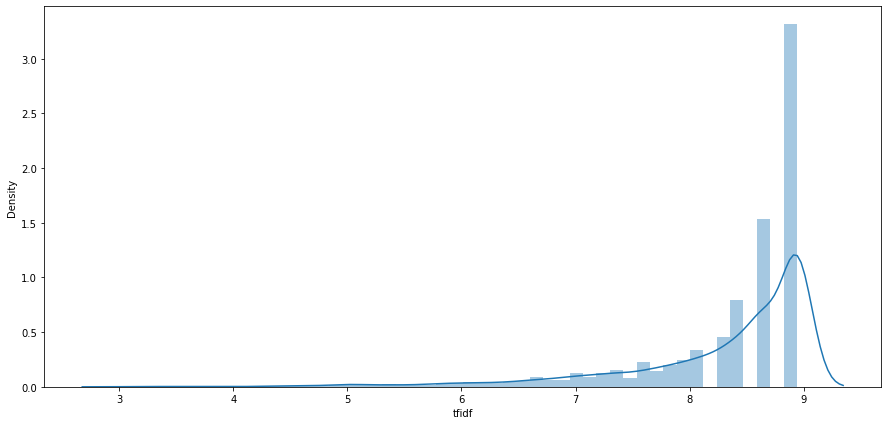

In [ ]:
plt.figure(figsize=(15,7))
sns.distplot(tfidf["tfidf"])

**Observations**

*   Low TF-IDF - Words that have low significance in the dataset - Erp, job, passwords, jobscheduler, failed etc.
*   High TF-IDF - Words that have high significance in the dataset - outside accessgroup, dst outside, src inside, src, accessgroup etc. 
*   TF-IDF distribution curve suggest that it has more dimensions to it. Thus it would be apt to apply some dimensionality reduction techniques like LDA.





**Tranforming tokens to vector using TF-IDF**

In [ ]:
# collect the tfid matrix in numpy array
array = tckt_tfidf.todense()

# store the tf-idf array into pandas dataframe
df_tfidf = pd.DataFrame(array)
df_tfidf.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,12230,12231,12232,12233,12234,12235,12236,12237,12238,12239,12240,12241,12242,12243,12244,12245,12246,12247,12248,12249,12250,12251,12252,12253,12254,12255,12256,12257,12258,12259,12260,12261,12262,12263,12264,12265,12266,12267,12268,12269
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.124129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#Check for equality in no of rows before and presence of null values before copying word count columns into TF-IDF vectorized dataframe
print(ticket_df[ticket_df.isnull().values == True])
print(ticket_df.shape)
print(df_tfidf.shape)

             Short description  ...                                     tokenized_desc
2588                       NaN  ...  nan link working ly resolve yhe issue urgent b...
3363                       NaN  ...  nan connected user system using teamviewer hel...
3885                       NaN  ...  nan user unable tologin vpn connected system u...
3889                       NaN  ...  nan user unable tologin vpn connected system u...
3894                       NaN  ...  nan user unable tologin vpn connected system u...
3900                       NaN  ...  nan user unable tologin vpn connected system u...
3903                       NaN  ...  nan browser microsoft internet explorer availa...
4319                       NaN  ...  nan trying log erp get t error help urgently p...
4373  i am locked out of skype  ...                                   locked skype nan

[9 rows x 11 columns]
(8432, 11)
(8432, 12270)


In [ ]:
df_tfidf['descr_len']= ticket_df['descr_len'].values
df_tfidf['num_wds']= ticket_df['num_wds'].values
df_tfidf['avg_word']= ticket_df['avg_word'].values
df_tfidf['uniq_wds']= ticket_df['uniq_wds'].values
df_tfidf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,12234,12235,12236,12237,12238,12239,12240,12241,12242,12243,12244,12245,12246,12247,12248,12249,12250,12251,12252,12253,12254,12255,12256,12257,12258,12259,12260,12261,12262,12263,12264,12265,12266,12267,12268,12269,descr_len,num_wds,avg_word,uniq_wds
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.124129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,125,18,6.000000,18
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,75,11,5.909091,11
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14,3,4.000000,3
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,26,5,4.400000,5
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11,2,5.000000,2


In [ ]:
# Apply Z-score to normalize the values
df_tfidf_z = df_tfidf.apply(zscore)  # convert all attributes to Z scale 
df_tfidf_z.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,12234,12235,12236,12237,12238,12239,12240,12241,12242,12243,12244,12245,12246,12247,12248,12249,12250,12251,12252,12253,12254,12255,12256,12257,12258,12259,12260,12261,12262,12263,12264,12265,12266,12267,12268,12269,descr_len,num_wds,avg_word,uniq_wds
0,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,3.517013,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,0.276837,0.317553,-0.240602,0.332661
1,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.089113,-0.068373,-0.308770,-0.062990
2,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.535572,-0.509431,-1.740291,-0.515163
3,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.447744,-0.399166,-1.440353,-0.402120
4,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.01

### **Label Encoding / One Hot Encoding**

**Label Encoding**

In [ ]:
#Label encoding non-vectorized dataframe
le = preprocessing.LabelEncoder()
ticket_df['Assignment group'] = ticket_df['Assignment group'].astype(str)
ticket_df["LabelEncodings"] = le.fit_transform(ticket_df['Assignment group'])
y_classes_len = len(le.classes_)
le.classes_
print("No. of unique target group", y_classes_len)
ticket_df.head()
df_tfidf['LabelEncodings']= ticket_df['LabelEncodings'].values
df_tfidf_z['LabelEncodings']= ticket_df['LabelEncodings'].values

No. of unique target group 68


In [ ]:
df_tfidf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,12235,12236,12237,12238,12239,12240,12241,12242,12243,12244,12245,12246,12247,12248,12249,12250,12251,12252,12253,12254,12255,12256,12257,12258,12259,12260,12261,12262,12263,12264,12265,12266,12267,12268,12269,descr_len,num_wds,avg_word,uniq_wds,LabelEncodings
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.124129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,125,18,6.000000,18,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,75,11,5.909091,11,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14,3,4.000000,3,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,26,5,4.400000,5,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11,2,5.000000,2,0


In [ ]:
df_tfidf_z.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,12235,12236,12237,12238,12239,12240,12241,12242,12243,12244,12245,12246,12247,12248,12249,12250,12251,12252,12253,12254,12255,12256,12257,12258,12259,12260,12261,12262,12263,12264,12265,12266,12267,12268,12269,descr_len,num_wds,avg_word,uniq_wds,LabelEncodings
0,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,3.517013,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,0.276837,0.317553,-0.240602,0.332661,0
1,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.089113,-0.068373,-0.308770,-0.062990,0
2,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.535572,-0.509431,-1.740291,-0.515163,0
3,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.447744,-0.399166,-1.440353,-0.402120,0
4,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,

# **Modelling**

List of Machine Learning models to try out:

**Statistical ML Models**
*   Multinomial Logistic Regression
*   Support Vector Machine
*   Stochastic Gradient Descent
*   Multinomial Naive Bayes
*   K Nearest neighbor
*   Random Forest
*   Decision trees
*   Xgboost



**Neural Network Models**
*   Deep Neural Network
*   Convolutional Neural Network
*   Recurrent Neural Network
*   Recurrent Convolutional Neural Network
*   LSTM

## **Creating Model with complete imbalance dataset**

In [ ]:
bottom_20 = ticket_df['LabelEncodings'].value_counts().nsmallest(20).reset_index()
bottom_20

,index,LabelEncodings
0,56,1
1,64,2
2,49,2
3,65,2
4,52,2
5,62,2
6,51,3
7,31,3
8,58,3
9,61,3


In [ ]:
# Remove label encoded target group with one ticket each
ticket_df.drop(ticket_df[(ticket_df['LabelEncodings'] == 56)].index , inplace=True)
df_tfidf.drop(df_tfidf[(df_tfidf['LabelEncodings'] == 56)].index , inplace=True)
df_tfidf_z.drop(df_tfidf_z[(df_tfidf_z['LabelEncodings'] == 56)].index , inplace=True)

n_classes = len(ticket_df["LabelEncodings"].unique())
print(n_classes)

67


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
df_resLog = pd.DataFrame()

In [ ]:
from sklearn.metrics import precision_recall_curve
# A class that logs the time
class Timer():
    '''
    A generic class to log the time
    '''
    def __init__(self):
        self.start_ts = None
    def start(self):
        self.start_ts = time()
    def stop(self):
        return 'Time taken: %2fs' % (time()-self.start_ts)
    
timer = Timer()

# A method to train and test the model
def run_classification(model_name, estimator, X_train, X_test, y_train, y_test, arch_name=None, pipelineRequired=True, isDeepModel=False):
    timer.start()
    # train the model
    clf = estimator

    if pipelineRequired :
        clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
        hist = clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=10, batch_size=32,verbose=1)
        # predict from the classifier
        y_pred_prob = clf.predict(X_test)
        y_pred = y_pred_prob
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)

        nn_test_acc = hist.history['accuracy']
        nn_val_acc = hist.history['val_accuracy']
        nn_test_loss = hist.history['loss']
        nn_val_loss = hist.history['val_loss']

        epochs = range(1, len(nn_test_acc) + 1)

        plt.plot(epochs, nn_test_acc, 'ro', label='Training accuracy')
        plt.plot(epochs, nn_val_acc, 'g', label='Validation accuracy')
        plt.title('Training and validation accuracy')
        plt.legend()

        plt.figure()

        plt.plot(epochs, nn_test_loss, 'ro', label='Training loss')
        plt.plot(epochs, nn_val_loss, 'g', label='Validation loss')
        plt.title('Training and validation loss')
        plt.legend()

        plt.show()
    else :
        print("start")
        clf.fit(X_train, y_train)
        # predict from the claffier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
        y_pred_prob = clf.predict_proba(X_test)
    
    print('Estimator:', clf)
    print('='*80)
    train_acc = accuracy_score(y_train,y_train_pred)
    print('Training accuracy: ', (train_acc))
    test_acc = accuracy_score(y_test, y_pred)
    print('Testing accuracy: ', (test_acc))
    print('='*80)
    print('Confusion matrix:\n ', (confusion_matrix(y_test, y_pred)))
    print('='*80)
    print('Classification report:\n ', (classification_report(y_test, y_pred)))
    f1 = f1_score(y_pred, y_test, average='weighted', labels=np.unique(y_pred))
    print("F1 score: ",f1)
    # kappa
    kappa = cohen_kappa_score(y_test, y_pred)
    print('Cohens kappa: %f' % kappa)
    print(timer.stop(), 'to run the model')

    # ROC curve
    fpr = dict()
    tpr = dict()
    thresh = dict()
    for i in range(n_classes):
      fpr[i], tpr[i], thresh[i] = roc_curve(y_test.ravel(), y_pred_prob[:,i], pos_label=i)

    # plotting   
    plt.figure(figsize=(20,6))
    plt.subplot(1, 2, 1) 
    plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0')
    plt.plot(fpr[12], tpr[12], linestyle='--',color='green', label='Class 12')
    plt.plot(fpr[17], tpr[17], linestyle='--',color='blue', label='Class 17')
    plt.plot(fpr[20], tpr[20], linestyle='--',color='yellow', label='Class 20')
    plt.plot([0, 1], [0, 1], linestyle='--', color='red', label='Non-ideal')
    plt.title('Multiclass ROC curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive rate')
    plt.legend(loc='best')

    # Precision Recall curve
    precision = dict()
    recall = dict()
    thres = dict()
    for i in range(n_classes):
      precision[i], recall[i], thres[i] = precision_recall_curve(y_test.ravel(), y_pred_prob[:,i], pos_label=i)

    # plotting   
    plt.subplot(1, 2, 2) 
    plt.plot(recall[0], precision[0], linestyle='--',color='orange', label='Class 0')
    plt.plot(recall[12], precision[12], linestyle='--',color='green', label='Class 12')
    plt.plot(recall[17], precision[17], linestyle='--',color='blue', label='Class 17')
    plt.plot(recall[20], precision[20],color='yellow', label='Class 20')
    plt.title('Multiclass Precision Recall curve')
    plt.xlabel('recall')
    plt.ylabel('precision')
    plt.legend(loc='best')

    t = re.findall('\d*\.?\d+',(timer.stop()))
    df_results = pd.DataFrame()
    df_tempResults = pd.DataFrame({'Model':[model_name], 'Train Accuracy': [train_acc], 'Test Accuracy': [test_acc], 'F1 Score': [f1], 'Cohen Kappa Score': [kappa],  'Time Taken (sec)': [t[0]]})
    df_results = pd.concat([df_results, df_tempResults])
    return df_results

In [ ]:
# Unvectorized cleansed data
X = ticket_df.tokenized_desc
Y = ticket_df["LabelEncodings"]
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    Y	, 
                                                    test_size=0.20, 
                                                    random_state=42, stratify = Y)
print('Shape of the training set:', X_train.shape, X_test.shape)
print('Shape of the test set:', y_train.shape, y_test.shape)

Shape of the training set: (6744,) (1687,)
Shape of the test set: (6744,) (1687,)


In [ ]:
# Vectorized dataframe
X_v = df_tfidf.iloc[:,:-5]
Y_v = df_tfidf['LabelEncodings']
X_train_v, X_test_v, y_train_v, y_test_v = train_test_split(X_v, 
                                                    Y_v, 
                                                    test_size=0.20, 
                                                    random_state=42, stratify = Y_v)
print('Shape of the training set:', X_train_v.shape, X_test_v.shape)
print('Shape of the test set:', y_train_v.shape, y_test_v.shape)

Shape of the training set: (6744, 12270) (1687, 12270)
Shape of the test set: (6744,) (1687,)


In [ ]:
# Vectorized dataframe with word count features
X_vf = df_tfidf_z.iloc[:,:-1]
Y_vf = df_tfidf_z['LabelEncodings']
X_train_vf, X_test_vf, y_train_vf, y_test_vf = train_test_split(X_vf, 
                                                    Y_vf, 
                                                    test_size=0.20, 
                                                    random_state=42, stratify = Y_vf)
print('Shape of the training set:', X_train_vf.shape, X_test_vf.shape)
print('Shape of the test set:', y_train_vf.shape, y_test_vf.shape)

Shape of the training set: (6744, 12274) (1687, 12274)
Shape of the test set: (6744,) (1687,)


In [ ]:
# No of unique targets present in the train and test set 
Ytrain = pd.DataFrame()
Ytrain['Assignment group'] = le.inverse_transform(y_train)
Ytest = pd.DataFrame()
Ytest['Assignment group'] = le.inverse_transform(y_test)

train_test_df = pd.DataFrame()
train_test_df['Unique Targets'] = [len(Ytrain['Assignment group'].unique()), len(Ytest['Assignment group'].unique())]
train_test_df.index = ['Train', 'Test']
train_test_df.transpose()

,Train,Test
Unique Targets,67,62


The no. of unique targets in train is not the same with test due to high imbalance in the data, having as low as 2 tickets in few groups before splitting.

In [ ]:
# Train set target distribution
configure_plotly_browser_state()
Ytrain['Assignment group'].iplot(kind='hist', xTitle='Assignment Group', yTitle='count', colorscale='-orrd', title='Records by rare Assignment Groups- Histogram')

plt.show()

In [ ]:
# Test set target distribution
configure_plotly_browser_state()
Ytest['Assignment group'].iplot(kind='hist', xTitle='Assignment Group', yTitle='count', colorscale='-orrd', title='Records by rare Assignment Groups- Histogram')

plt.show()

## **Statistical ML Models**

### **Multinomial Logistic Regression**

In [ ]:
df_LR_Results = pd.DataFrame(columns=['Model','Train Accuracy','Test Accuracy','F1 Score','Cohen Kappa Score','Time Taken (sec)'])

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(multi_class='multinomial'))])
Training accuracy:  0.663552787663108
Testing accuracy:  0.6218138707765264
Confusion matrix:
  [[783   0   0 ...   0   0   0]
 [  1   0   0 ...   0   3   0]
 [ 15   0   1 ...   0  12   0]
 ...
 [ 10   0   0 ...   4   0   0]
 [  4   0   0 ...   0 125   0]
 [ 10   0   0 ...   0  34   3]]
Classification report:
                precision    recall  f1-score   support

           0       0.63      0.99      0.77       792
           1       0.00      0.00      0.00         6
           2       0.50      0.04      0.07        28
           3       0.00      0.00      0.00         6
           4       0.57      0.31      0.41        51
           5       0.59      0.45      0.51        29
           6       0.62      0.33      0.43        24
           7       0.00      0.00      0.00         8
           8       0.00      0.00 

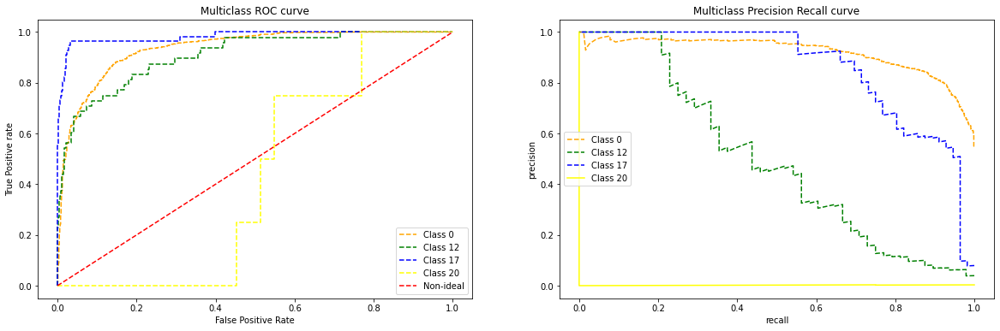

In [ ]:
model_name = 'Multinomial Logistic Regression'
df_temp = run_classification(model_name, LogisticRegression(multi_class='multinomial', solver='lbfgs'), X_train, X_test, y_train, y_test)
df_LR_Results = pd.concat([df_LR_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf',
                 LogisticRegression(class_weight='balanced',
                                    multi_class='multinomial'))])
Training accuracy:  0.5029655990510083
Testing accuracy:  0.3787788974510966
Confusion matrix:
  [[244   0   0 ...  38   0   0]
 [  0   1   0 ...   0   0   0]
 [  0   0  10 ...   0   0   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0  35   0]
 [  0   0   0 ...   0   0   3]]
Classification report:
                precision    recall  f1-score   support

           0       0.96      0.31      0.47       792
           1       0.50      0.17      0.25         6
           2       1.00      0.36      0.53        28
           3       0.12      0.33      0.17         6
           4       0.52      0.33      0.40        51
           5       0.49      0.62      0.55        29
           6       0.29      0.50      0.36        24
         

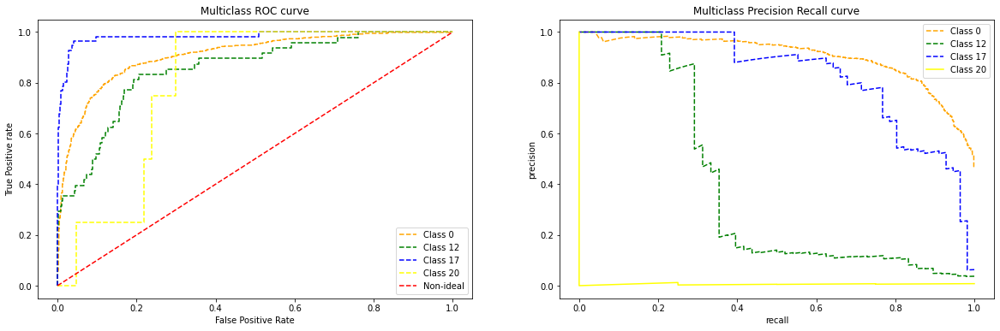

In [ ]:
model_name = 'Multinomial Logistic Regression with b-weights'
df_temp = run_classification(model_name, LogisticRegression(multi_class='multinomial', solver='lbfgs',class_weight='balanced'), X_train, X_test, y_train, y_test)
df_LR_Results = pd.concat([df_LR_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

start
Estimator: LogisticRegression(multi_class='multinomial')
Training accuracy:  0.66429418742586
Testing accuracy:  0.6182572614107884
Confusion matrix:
  [[791   0   0 ...   0   0   0]
 [  2   0   0 ...   0   3   0]
 [ 14   0   0 ...   0  12   0]
 ...
 [ 11   0   0 ...   3   0   0]
 [  6   0   0 ...   0 124   0]
 [ 11   0   0 ...   0  34   3]]
Classification report:
                precision    recall  f1-score   support

           0       0.61      1.00      0.76       792
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00        28
           3       0.00      0.00      0.00         6
           4       0.58      0.27      0.37        51
           5       0.45      0.31      0.37        29
           6       0.86      0.25      0.39        24
           7       0.00      0.00      0.00         8
           8       0.00      0.00      0.00        17
           9       1.00      0.94      0.97        16
          10       0.83      0

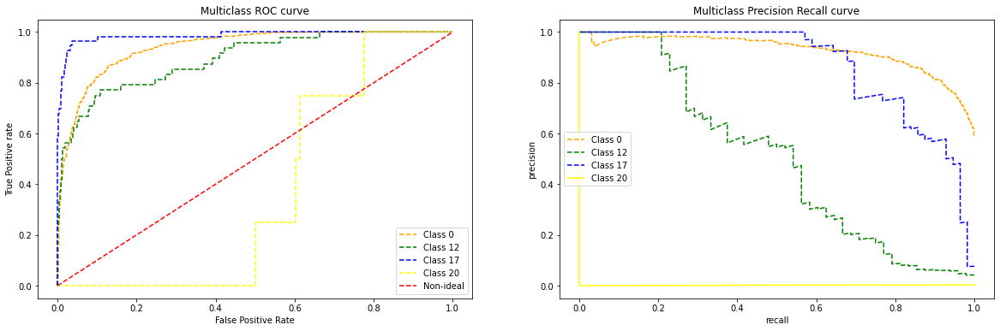

In [ ]:
model_name = 'Multinomial Logistic Regression with vectorized i/p'
df_temp = run_classification(model_name, LogisticRegression(multi_class='multinomial', solver='lbfgs'), X_train_v, X_test_v, y_train_v, y_test_v, arch_name= None, pipelineRequired=False)
df_LR_Results = pd.concat([df_LR_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

start
Estimator: LogisticRegression(multi_class='multinomial')
Training accuracy:  0.9301601423487544
Testing accuracy:  0.6301126259632484
Confusion matrix:
  [[643   0   1 ...   2   0   3]
 [  0   1   0 ...   0   3   0]
 [  2   0   9 ...   0  12   0]
 ...
 [  5   0   0 ...   6   0   0]
 [  1   0   0 ...   0 120   0]
 [  2   0   0 ...   0  34   8]]
Classification report:
                precision    recall  f1-score   support

           0       0.81      0.81      0.81       792
           1       1.00      0.17      0.29         6
           2       0.47      0.32      0.38        28
           3       0.00      0.00      0.00         6
           4       0.61      0.49      0.54        51
           5       0.50      0.62      0.55        29
           6       0.52      0.50      0.51        24
           7       0.50      0.25      0.33         8
           8       0.67      0.35      0.46        17
           9       0.93      0.88      0.90        16
          10       0.38     

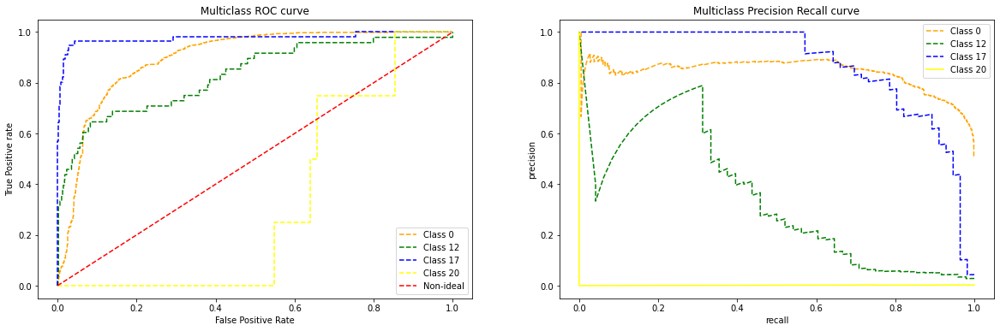

In [ ]:
model_name = 'Multinomial Logistic Regression with vectorized i/p & word count features'
df_temp = run_classification(model_name, LogisticRegression(multi_class='multinomial', solver='lbfgs'), X_train_vf, X_test_vf, y_train_vf, y_test_vf, arch_name= None, pipelineRequired=False)
df_LR_Results = pd.concat([df_LR_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

In [ ]:
df_LR_Results.sort_values(by='Cohen Kappa Score', ascending = False, ignore_index = True)

,Model,Train Accuracy,Test Accuracy,F1 Score,Cohen Kappa Score,Time Taken (sec)
0,Multinomial Logistic Regression with vectorize...,0.930160,0.630113,0.642346,0.514648,147.165792
1,Multinomial Logistic Regression,0.663553,0.621814,0.722842,0.407764,22.505892
2,Multinomial Logistic Regression with vectorize...,0.664294,0.618257,0.723811,0.392523,144.576623
3,Multinomial Logistic Regression with b-weights,0.502966,0.378779,0.342945,0.322900,14.447397


In [ ]:
df_LR_Results.to_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/LR_Results.csv', index=False, encoding='utf_8_sig')

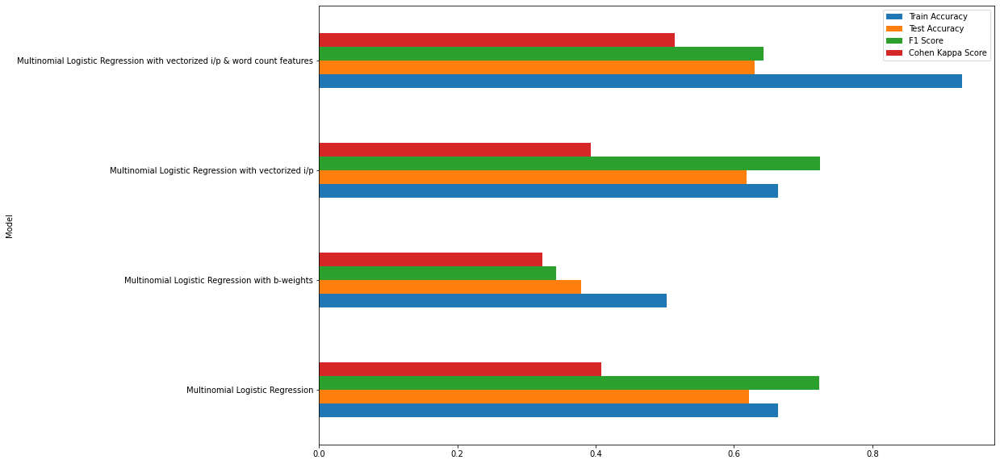

In [ ]:
df_LR_Results.plot(kind='barh',x='Model', figsize=[15,10])

### **Support Vector Machine**

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', SVC(probability=True))])
Training accuracy:  0.7937425860023725
Testing accuracy:  0.6200355660936574
Confusion matrix:
  [[788   0   0 ...   0   0   1]
 [  2   1   0 ...   0   3   0]
 [ 12   0   4 ...   0  12   0]
 ...
 [  9   0   0 ...   5   0   0]
 [  1   0   0 ...   0 126   0]
 [ 13   0   0 ...   0  34   3]]
Classification report:
                precision    recall  f1-score   support

           0       0.61      0.99      0.76       792
           1       1.00      0.17      0.29         6
           2       1.00      0.14      0.25        28
           3       0.00      0.00      0.00         6
           4       0.70      0.27      0.39        51
           5       0.29      0.07      0.11        29
           6       0.67      0.33      0.44        24
           7       0.00      0.00      0.00         8
           8       0.00      0.00      0.00        17
   

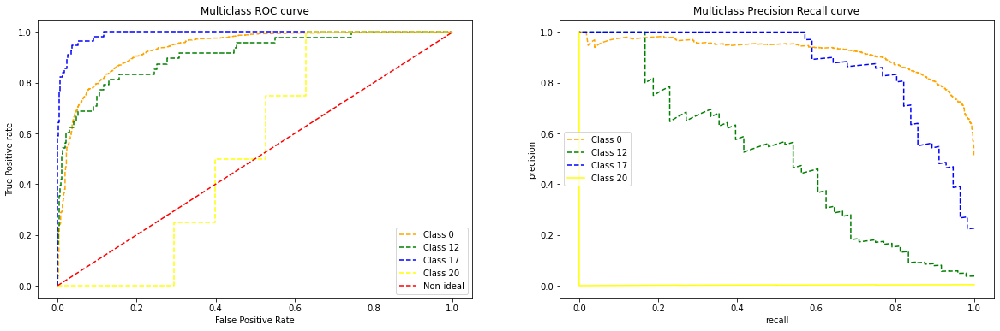

In [ ]:
model_name = 'SVM-RBF Kernal'
df_temp = run_classification(model_name, SVC(kernel='rbf', probability = True), X_train, X_test, y_train, y_test)
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', SVC(class_weight='balanced', probability=True))])
Training accuracy:  0.6316725978647687
Testing accuracy:  0.45168938944872555
Confusion matrix:
  [[396   0   0 ...   9   0   0]
 [  0   1   0 ...   0   0   0]
 [  1   0   5 ...   0   0   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0  33   0]
 [  0   0   0 ...   0   0   3]]
Classification report:
                precision    recall  f1-score   support

           0       0.93      0.50      0.65       792
           1       0.50      0.17      0.25         6
           2       0.83      0.18      0.29        28
           3       0.00      0.00      0.00         6
           4       0.55      0.43      0.48        51
           5       0.39      0.93      0.55        29
           6       0.31      0.50      0.38        24
           7       0.50      0.12      0.20         8
           8       0.38      0.

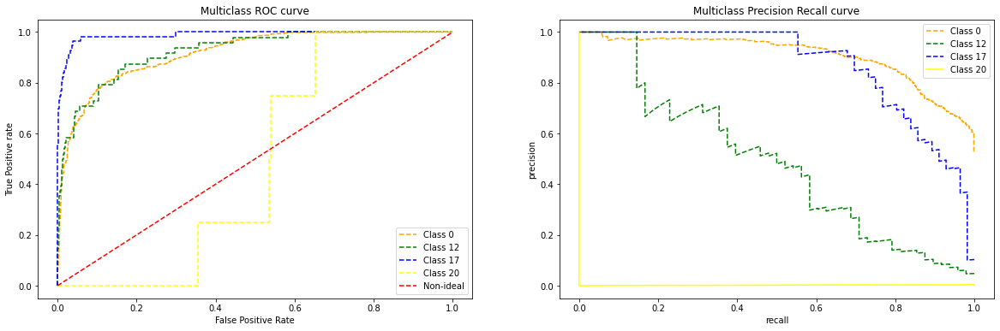

In [ ]:
model_name = 'SVM-RBF Kernal with b-weights'
df_temp = run_classification(model_name, SVC(kernel='rbf', probability = True, class_weight='balanced'), X_train, X_test, y_train, y_test)
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

### **Stochastic Gradient Descent**

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf',
                 SGDClassifier(alpha=0.001, loss='modified_huber', max_iter=100,
                               random_state=42, tol=None))])
Training accuracy:  0.7620106761565836
Testing accuracy:  0.6544161232957914
Confusion matrix:
  [[773   0   1 ...   2   0   0]
 [  1   0   0 ...   0   3   0]
 [ 10   0   3 ...   0  12   0]
 ...
 [  7   0   0 ...   5   0   0]
 [  3   0   0 ...   0 126   0]
 [  8   0   0 ...   0  34   6]]
Classification report:
                precision    recall  f1-score   support

           0       0.68      0.98      0.80       792
           1       0.00      0.00      0.00         6
           2       0.43      0.11      0.17        28
           3       0.00      0.00      0.00         6
           4       0.67      0.39      0.49        51
           5       0.57      0.69      0.62        29
           6       0.67      0.42      0.51     

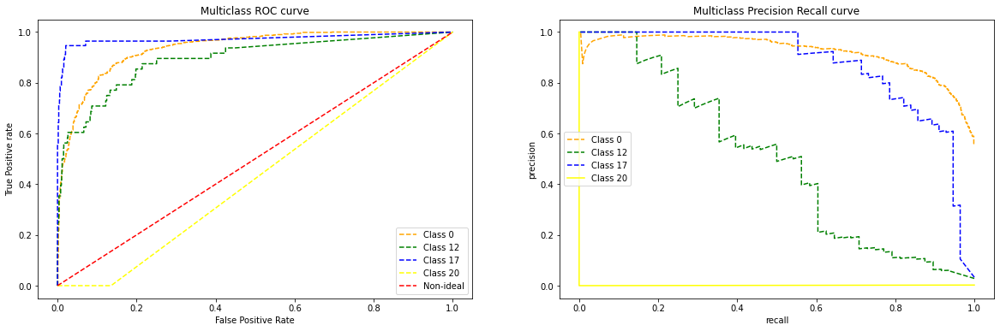

In [ ]:
model_name = 'Stochastic Gradient Descent'
df_temp = run_classification(model_name, SGDClassifier(loss='modified_huber', penalty='l2',alpha=1e-3, random_state=42, max_iter=100, tol=None), X_train, X_test, y_train, y_test)
# df_SGD_Results = pd.concat([df_SGD_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf',
                 SGDClassifier(alpha=0.001, class_weight='balanced',
                               loss='modified_huber', max_iter=100,
                               random_state=42, tol=None))])
Training accuracy:  0.6803084223013048
Testing accuracy:  0.4919976289270895
Confusion matrix:
  [[438   2   0 ...   9   0   1]
 [  0   1   0 ...   0   0   0]
 [  0   0  11 ...   0   0   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0  43   0]
 [  0   0   0 ...   0   0   7]]
Classification report:
                precision    recall  f1-score   support

           0       0.95      0.55      0.70       792
           1       0.20      0.17      0.18         6
           2       0.79      0.39      0.52        28
           3       0.07      0.17      0.10         6
           4       0.53      0.33      0.41        51
           5       0.55      0.62      0.58   

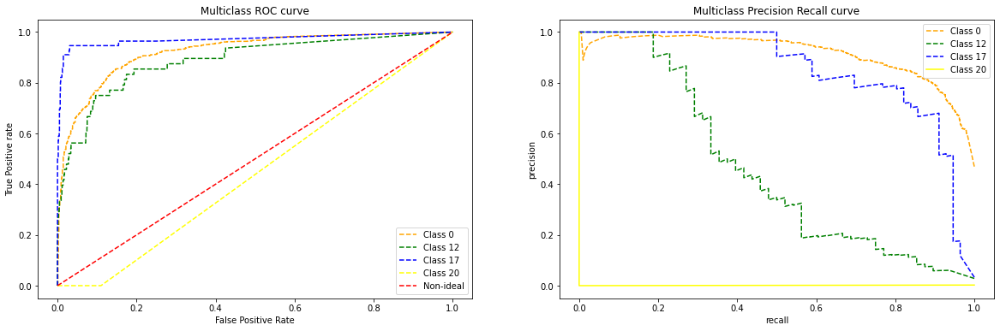

In [ ]:
model_name = 'Stochastic Gradient Descent with b-weights'
df_temp = run_classification(model_name, SGDClassifier(loss='modified_huber', penalty='l2',alpha=1e-3, random_state=42, max_iter=100, tol=None,class_weight='balanced'), X_train, X_test, y_train, y_test)
# df_SGD_Results = pd.concat([df_SGD_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

### **Multinomial Naive Bayes**

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', MultinomialNB())])
Training accuracy:  0.5682087781731909
Testing accuracy:  0.5548310610551275
Confusion matrix:
  [[792   0   0 ...   0   0   0]
 [  2   0   0 ...   0   3   0]
 [ 13   0   0 ...   0  15   0]
 ...
 [ 14   0   0 ...   0   0   0]
 [  7   0   0 ...   0 125   0]
 [ 13   0   0 ...   0  37   0]]
Classification report:
                precision    recall  f1-score   support

           0       0.56      1.00      0.72       792
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00        28
           3       0.00      0.00      0.00         6
           4       0.50      0.08      0.14        51
           5       0.00      0.00      0.00        29
           6       0.00      0.00      0.00        24
           7       0.00      0.00      0.00         8
           8       0.00      0.00      0.00        17
         

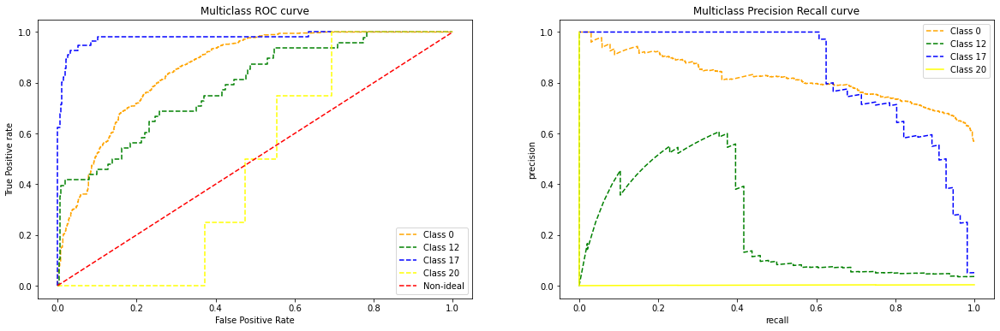

In [ ]:
model_name = 'Multinomial Naive Bayes'
df_temp = run_classification(model_name, MultinomialNB(), X_train, X_test, y_train, y_test)
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]  =df_temp

### **K Nearest neighbor**

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', KNeighborsClassifier())])
Training accuracy:  0.6933570581257414
Testing accuracy:  0.6336692353289863
Confusion matrix:
  [[771   0   0 ...   1   0   0]
 [  1   1   0 ...   0   3   0]
 [  5   0   5 ...   0  15   0]
 ...
 [ 10   0   0 ...   4   0   0]
 [  3   0   0 ...   0 121   0]
 [  8   0   0 ...   0  34   5]]
Classification report:
                precision    recall  f1-score   support

           0       0.68      0.97      0.80       792
           1       0.50      0.17      0.25         6
           2       0.36      0.18      0.24        28
           3       0.00      0.00      0.00         6
           4       0.57      0.39      0.47        51
           5       0.52      0.38      0.44        29
           6       0.57      0.33      0.42        24
           7       0.00      0.00      0.00         8
           8       0.00      0.00      0.00        17
  

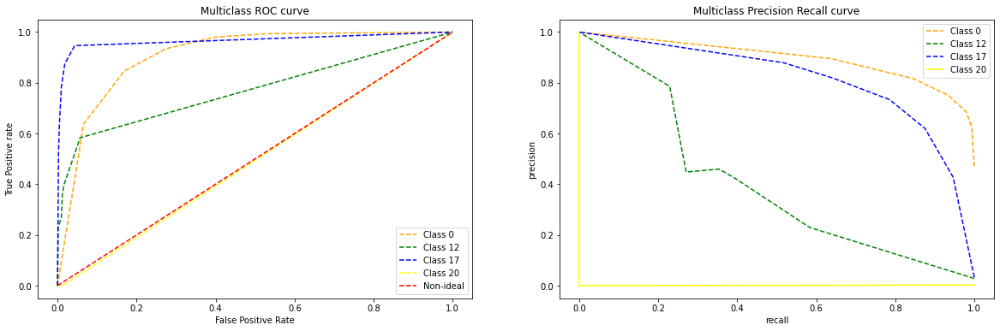

In [ ]:
model_name = 'K Nearest neighbor'
df_temp = run_classification(model_name, KNeighborsClassifier(), X_train, X_test, y_train, y_test)
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

### **Random Forest**

In [ ]:
df_RF_Results = pd.DataFrame(columns=['Model','Train Accuracy','Test Accuracy','F1 Score','Cohen Kappa Score','Time Taken (sec)'])

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', RandomForestClassifier())])
Training accuracy:  0.9349051008303677
Testing accuracy:  0.6473029045643154
Confusion matrix:
  [[781   0   0 ...   1   0   0]
 [  1   1   0 ...   0   3   0]
 [  8   0   5 ...   0  13   0]
 ...
 [  9   0   0 ...   5   0   0]
 [  2   0   0 ...   0 124   0]
 [ 11   0   0 ...   0  34   3]]
Classification report:
                precision    recall  f1-score   support

           0       0.66      0.99      0.79       792
           1       1.00      0.17      0.29         6
           2       1.00      0.18      0.30        28
           3       0.00      0.00      0.00         6
           4       0.62      0.25      0.36        51
           5       0.52      0.52      0.52        29
           6       0.69      0.38      0.49        24
           7       0.00      0.00      0.00         8
           8       1.00      0.18      0.30        17


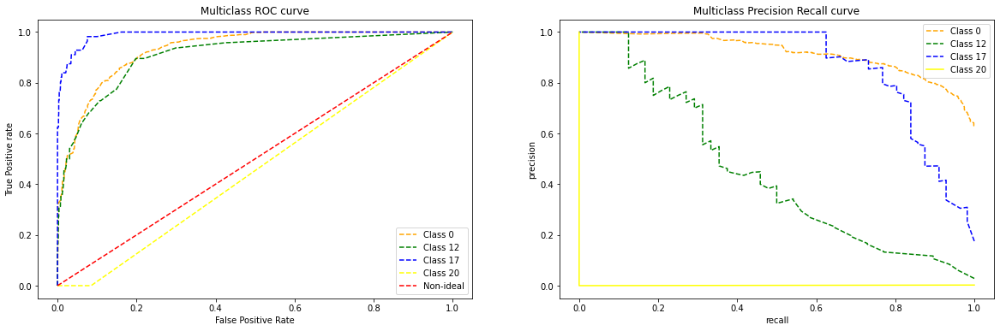

In [ ]:
model_name = 'Random Forest'
df_temp = run_classification(model_name, RandomForestClassifier(n_estimators=100), X_train, X_test, y_train, y_test)
df_RF_Results = pd.concat([df_RF_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', RandomForestClassifier(class_weight='balanced'))])
Training accuracy:  0.8908659549228944
Testing accuracy:  0.5874333135743924
Confusion matrix:
  [[763   0   0 ...   9   0   0]
 [  2   1   0 ...   0   0   0]
 [ 10   0   3 ...   0   0   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  2   0   0 ...   0  47   0]
 [ 11   0   0 ...   0   0   3]]
Classification report:
                precision    recall  f1-score   support

           0       0.63      0.96      0.76       792
           1       1.00      0.17      0.29         6
           2       0.75      0.11      0.19        28
           3       0.00      0.00      0.00         6
           4       0.60      0.24      0.34        51
           5       0.46      0.21      0.29        29
           6       0.67      0.42      0.51        24
           7       0.00      0.00      0.00         8
           8       1.00      0.

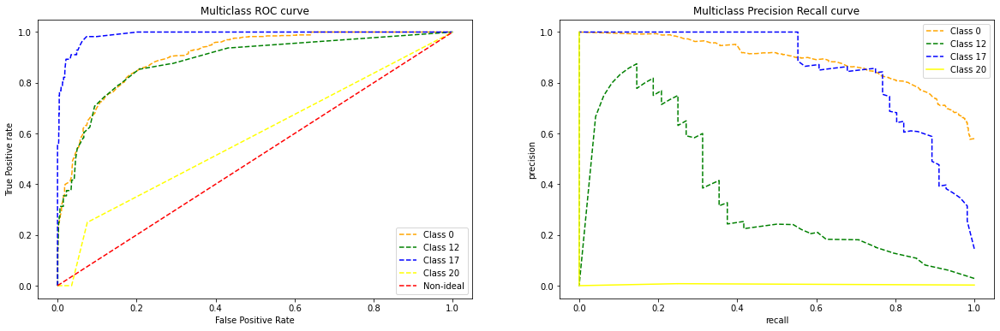

In [ ]:
model_name = 'Random Forest with b-weights'
df_temp = run_classification(model_name, RandomForestClassifier(n_estimators=100, class_weight = 'balanced'), X_train, X_test, y_train, y_test)
df_RF_Results = pd.concat([df_RF_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: RandomForestClassifier()
Training accuracy:  0.9313463819691578
Testing accuracy:  0.6544161232957914
Confusion matrix:
  [[774   0   0 ...   2   0   0]
 [  0   1   0 ...   0   3   0]
 [  9   0   4 ...   0  12   0]
 ...
 [  7   0   0 ...   7   0   0]
 [  1   0   0 ...   0 122   0]
 [ 11   0   0 ...   0  34   3]]
Classification report:
                precision    recall  f1-score   support

           0       0.68      0.98      0.80       792
           1       1.00      0.17      0.29         6
           2       0.80      0.14      0.24        28
           3       0.00      0.00      0.00         6
           4       0.60      0.35      0.44        51
           5       0.38      0.41      0.39        29
           6       0.71      0.42      0.53        24
           7       0.67      0.25      0.36         8
           8       1.00      0.12      0.21        17
           9       1.00      0.94      0.97        16
          10       0.56      0.28      0.37      

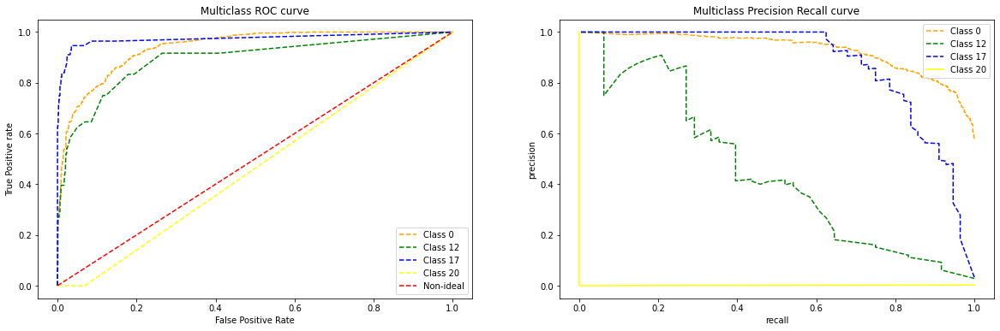

In [ ]:
model_name = 'Random Forest with vectorized i/p'
df_temp = run_classification(model_name, RandomForestClassifier(n_estimators=100), X_train_v, X_test_v, y_train_v, y_test_v, arch_name= None, pipelineRequired=False)
df_RF_Results = pd.concat([df_RF_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: RandomForestClassifier()
Training accuracy:  0.9356465005931198
Testing accuracy:  0.6366330764671013
Confusion matrix:
  [[773   0   0 ...   2   0   1]
 [  1   2   0 ...   0   3   0]
 [  9   0   4 ...   0  12   0]
 ...
 [  9   0   0 ...   5   0   0]
 [  1   0   0 ...   0 123   0]
 [ 11   0   0 ...   0  33   4]]
Classification report:
                precision    recall  f1-score   support

           0       0.66      0.98      0.79       792
           1       1.00      0.33      0.50         6
           2       1.00      0.14      0.25        28
           3       0.00      0.00      0.00         6
           4       0.60      0.29      0.39        51
           5       0.33      0.28      0.30        29
           6       0.75      0.38      0.50        24
           7       0.50      0.12      0.20         8
           8       1.00      0.12      0.21        17
           9       1.00      0.94      0.97        16
          10       0.57      0.22      0.32      

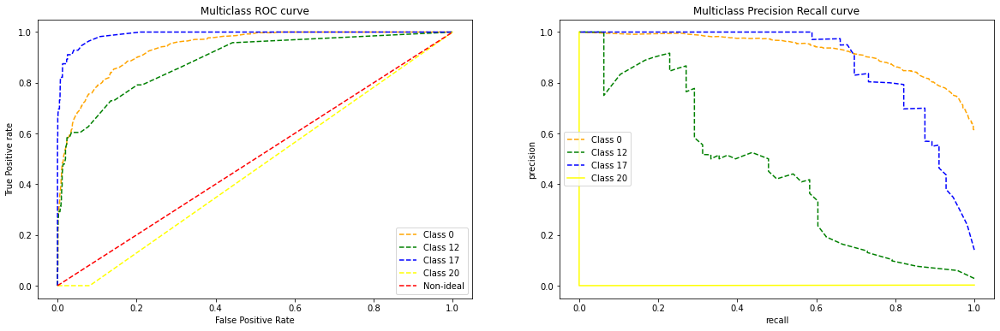

In [ ]:
model_name = 'Random Forest with vectorized i/p & word count features'
df_temp = run_classification(model_name, RandomForestClassifier(n_estimators=100), X_train_vf, X_test_vf, y_train_vf, y_test_vf, arch_name= None, pipelineRequired=False)
df_RF_Results = pd.concat([df_RF_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

In [ ]:
df_RF_Results.sort_values(by='Cohen Kappa Score', ascending = False, ignore_index = True)

,Model,Train Accuracy,Test Accuracy,F1 Score,Cohen Kappa Score,Time Taken (sec)
0,Random Forest with vectorized i/p,0.931346,0.654416,0.728320,0.484662,44.757401
1,Random Forest,0.934905,0.647303,0.727710,0.464623,11.560114
2,Random Forest with vectorized i/p & word count...,0.935647,0.636633,0.714570,0.448460,40.549523
3,Random Forest with b-weights,0.890866,0.587433,0.649003,0.372716,13.923029


In [ ]:
df_RF_Results.to_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/RF_Results.csv', index=False, encoding='utf_8_sig')

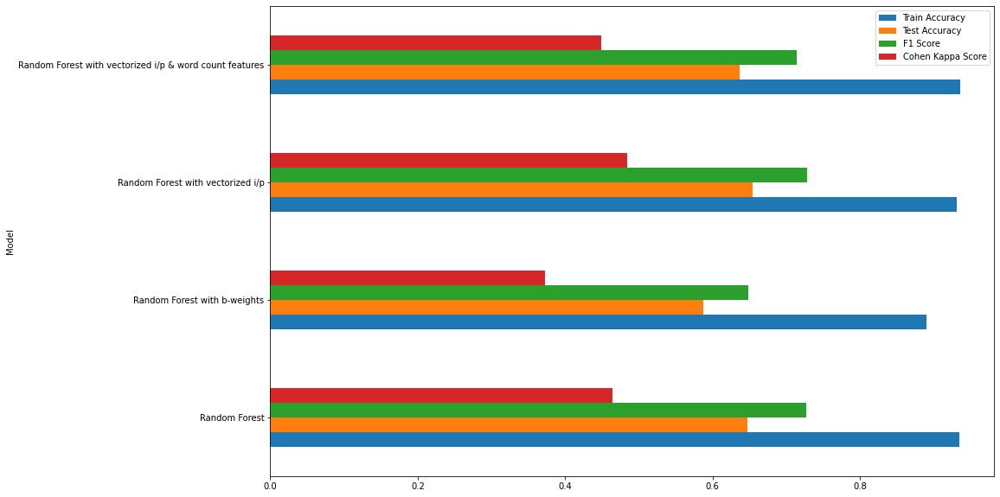

In [ ]:
df_RF_Results.plot(kind='barh',x='Model', figsize=[15,10])

### **Decision trees**

In [ ]:
df_DT_Results = pd.DataFrame(columns=['Model','Train Accuracy','Test Accuracy','F1 Score','Cohen Kappa Score','Time Taken (sec)'])

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', DecisionTreeClassifier())])
Training accuracy:  0.9349051008303677
Testing accuracy:  0.5903971547125074
Confusion matrix:
  [[658   0   6 ...   3   0   4]
 [  0   1   0 ...   0   3   0]
 [  2   0   6 ...   0  12   0]
 ...
 [  7   0   0 ...   7   0   0]
 [  1   0   0 ...   0 117   1]
 [  4   0   0 ...   0  34   8]]
Classification report:
                precision    recall  f1-score   support

           0       0.76      0.83      0.79       792
           1       0.50      0.17      0.25         6
           2       0.38      0.21      0.27        28
           3       0.50      0.17      0.25         6
           4       0.47      0.43      0.45        51
           5       0.40      0.41      0.41        29
           6       0.44      0.29      0.35        24
           7       0.67      0.50      0.57         8
           8       0.42      0.47      0.44        17


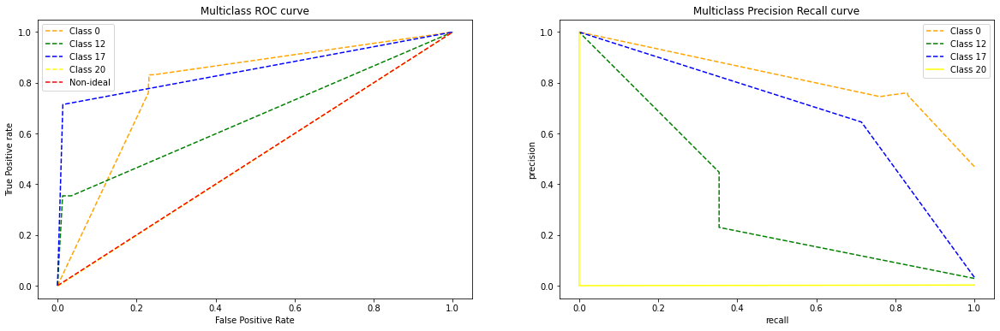

In [ ]:
model_name = 'Decision trees'
df_temp = run_classification(model_name, DecisionTreeClassifier(), X_train, X_test, y_train, y_test)
df_DT_Results = pd.concat([df_DT_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', DecisionTreeClassifier(class_weight='balanced'))])
Training accuracy:  0.8827105575326216
Testing accuracy:  0.49259039715471253
Confusion matrix:
  [[552   0   7 ...   9   1   4]
 [  1   1   0 ...   0   0   0]
 [  1   0   3 ...   0   0   2]
 ...
 [  0   0   0 ...   0   0   0]
 [  1   0   0 ...   0  37   0]
 [  3   0   0 ...   0   0   9]]
Classification report:
                precision    recall  f1-score   support

           0       0.79      0.70      0.74       792
           1       1.00      0.17      0.29         6
           2       0.17      0.11      0.13        28
           3       0.29      0.33      0.31         6
           4       0.35      0.29      0.32        51
           5       0.25      0.24      0.25        29
           6       0.20      0.29      0.24        24
           7       0.11      0.12      0.12         8
           8       0.36      0

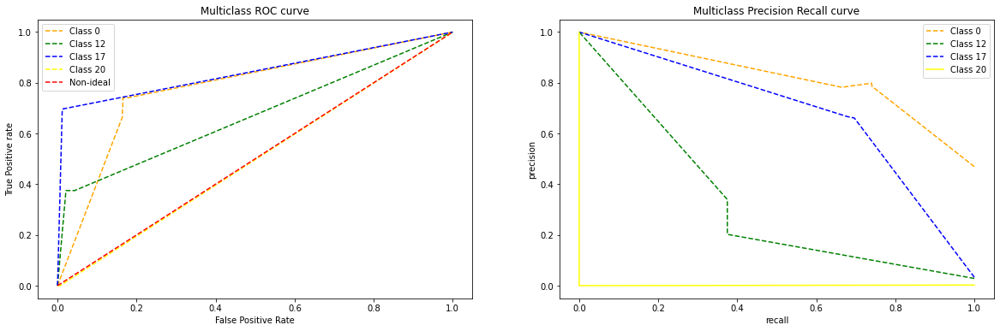

In [ ]:
model_name = 'Decision trees with b-weights'
df_temp = run_classification(model_name, DecisionTreeClassifier(class_weight='balanced'), X_train, X_test, y_train, y_test)
df_DT_Results = pd.concat([df_DT_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: DecisionTreeClassifier()
Training accuracy:  0.9313463819691578
Testing accuracy:  0.6016597510373444
Confusion matrix:
  [[668   1   2 ...   2   1   3]
 [  0   0   0 ...   0   3   0]
 [  4   0   5 ...   0  12   1]
 ...
 [  5   0   1 ...   7   0   0]
 [  1   0   1 ...   0 114   0]
 [  6   0   0 ...   0  34   6]]
Classification report:
                precision    recall  f1-score   support

           0       0.79      0.84      0.81       792
           1       0.00      0.00      0.00         6
           2       0.29      0.18      0.22        28
           3       0.00      0.00      0.00         6
           4       0.50      0.35      0.41        51
           5       0.31      0.38      0.34        29
           6       0.39      0.46      0.42        24
           7       0.33      0.12      0.18         8
           8       0.50      0.41      0.45        17
           9       1.00      1.00      1.00        16
          10       0.25      0.28      0.26      

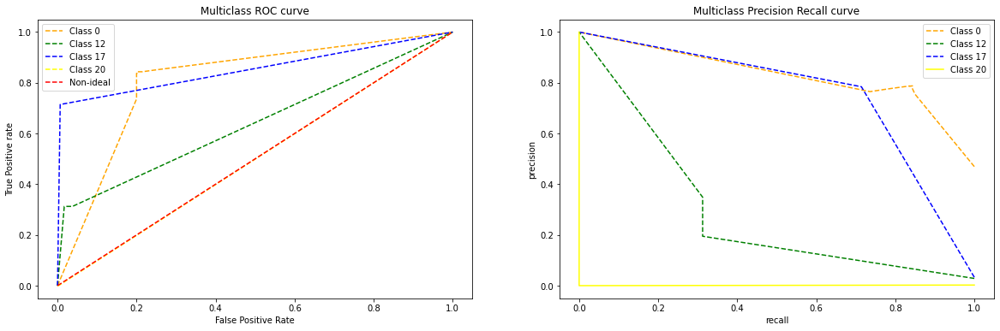

In [ ]:
model_name = 'Decision trees with vectorized i/p'
df_temp = run_classification(model_name, DecisionTreeClassifier(), X_train_v, X_test_v, y_train_v, y_test_v, arch_name= None, pipelineRequired=False)
df_DT_Results = pd.concat([df_DT_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: DecisionTreeClassifier()
Training accuracy:  0.9356465005931198
Testing accuracy:  0.5826911677534085
Confusion matrix:
  [[650   0   4 ...   3   1   2]
 [  0   0   0 ...   0   3   0]
 [  5   0   4 ...   0  12   0]
 ...
 [  3   0   0 ...   8   0   0]
 [  0   0   0 ...   0 118   0]
 [  6   0   0 ...   0  33   4]]
Classification report:
                precision    recall  f1-score   support

           0       0.76      0.82      0.79       792
           1       0.00      0.00      0.00         6
           2       0.29      0.14      0.19        28
           3       0.00      0.00      0.00         6
           4       0.43      0.41      0.42        51
           5       0.34      0.38      0.36        29
           6       0.26      0.25      0.26        24
           7       0.40      0.25      0.31         8
           8       0.33      0.29      0.31        17
           9       1.00      1.00      1.00        16
          10       0.33      0.28      0.30      

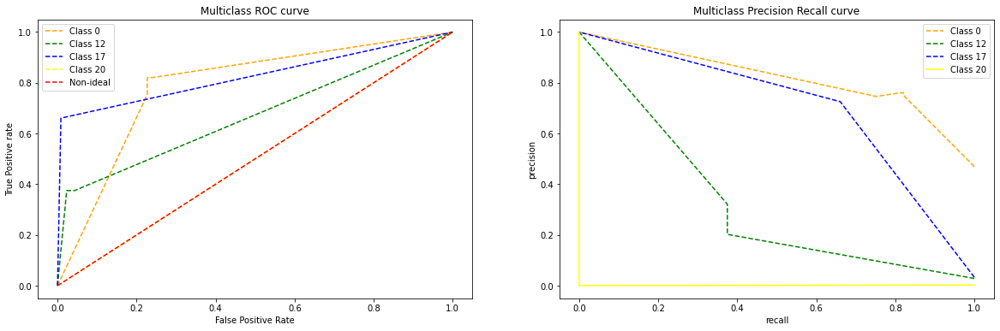

In [ ]:
model_name = 'Decision trees with vectorized i/p & word count features'
df_temp = run_classification(model_name, DecisionTreeClassifier(), X_train_vf, X_test_vf, y_train_vf, y_test_vf, arch_name= None, pipelineRequired=False)
df_DT_Results = pd.concat([df_DT_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

In [ ]:
df_DT_Results.sort_values(by='Cohen Kappa Score', ascending = False, ignore_index = True)

,Model,Train Accuracy,Test Accuracy,F1 Score,Cohen Kappa Score,Time Taken (sec)
0,Decision trees with vectorized i/p,0.931346,0.601660,0.623561,0.467233,15.968921
1,Decision trees,0.934905,0.590397,0.617562,0.448291,2.087770
2,Decision trees with vectorized i/p & word coun...,0.935647,0.582691,0.608252,0.440582,12.002043
3,Decision trees with b-weights,0.882711,0.492590,0.472344,0.361717,2.984813


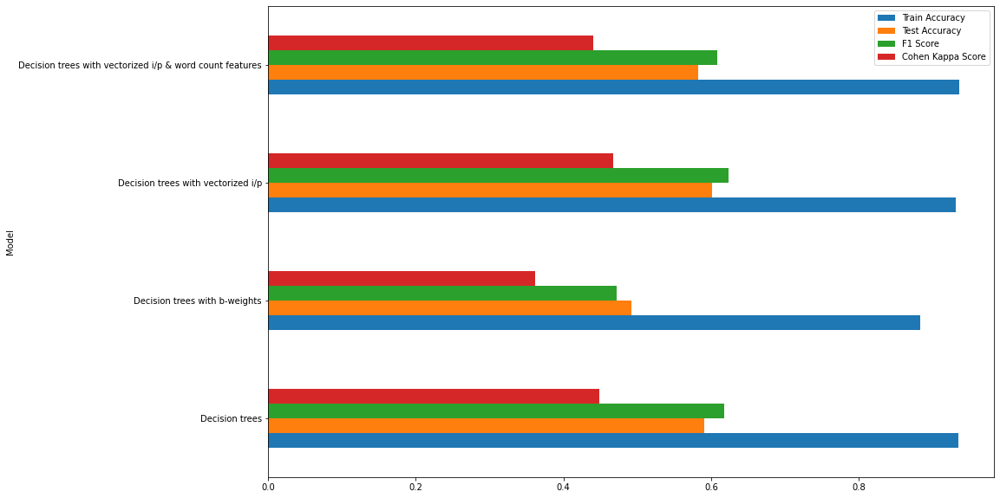

In [ ]:
df_DT_Results.plot(kind='barh',x='Model', figsize=[15,10])

### **xgboost**

start
Estimator: Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf',
                 XGBClassifier(colsample_bytree=0.8, max_depth=7,
                               n_estimators=200, nthread=10,
                               objective='multi:softprob', subsample=0.8))])
Training accuracy:  0.8871589561091341
Testing accuracy:  0.6395969176052163
Confusion matrix:
  [[744   0   1 ...   3   0   2]
 [  0   1   0 ...   0   3   0]
 [  5   0   7 ...   0  12   0]
 ...
 [  4   0   0 ...   9   0   0]
 [  2   0   0 ...   0 120   0]
 [  7   0   0 ...   0  34   5]]
Classification report:
                precision    recall  f1-score   support

           0       0.71      0.94      0.81       792
           1       0.25      0.17      0.20         6
           2       0.70      0.25      0.37        28
           3       0.33      0.17      0.22         6
           4       0.53      0.45      0.49        51
           5       0.45      0.52      0

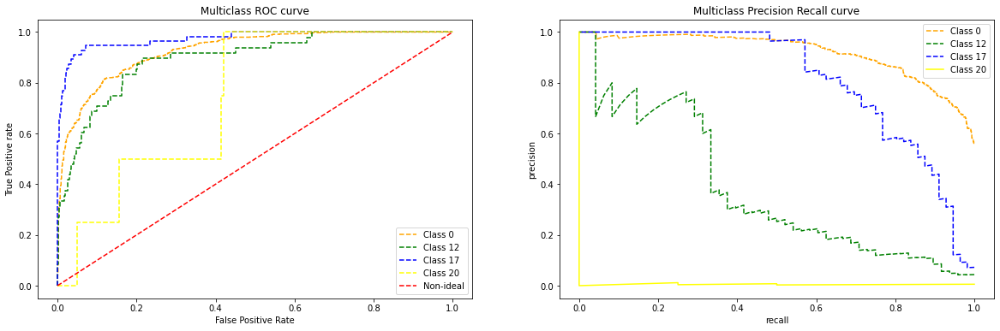

In [ ]:
model_name = 'xgboost'
df_temp = run_classification(model_name, xgb.XGBClassifier(max_depth=7, n_estimators=200, colsample_bytree=0.8, 
                        subsample=0.8, nthread=10, learning_rate=0.1), X_train, X_test, y_train, y_test)
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

## **Deep Learning Models**

### **Neural Network**

In [ ]:
X_train_v = X_train_v.to_numpy()
X_test_v = X_test_v.to_numpy()
y_train_n = np.array(y_train_v.values.tolist())
y_test_n = np.array(y_test_v.values.tolist())

In [ ]:
nn_model = Sequential()
nn_model.add(Dense(500, input_shape=(len(X_train_v[0]),), activation='relu'))
nn_model.add(Dropout(0.5))
nn_model.add(Dense(200, activation='relu'))
nn_model.add(Dropout(0.3))
nn_model.add(Dense(100, activation='relu'))
nn_model.add(Dropout(0.2))
nn_model.add(Dense(68, activation='softmax', name='Output'))
nn_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 500)               6135500   
_________________________________________________________________
dropout (Dropout)            (None, 500)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               100200    
_________________________________________________________________
dropout_1 (Dropout)          (None, 200)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               20100     
_________________________________________________________________
dropout_2 (Dropout)          (None, 100)               0         
_________________________________________________________________
Output (Dense)               (None, 68)                6

In [ ]:
sgd = SGD(learning_rate=0.01, decay=1e-6, momentum=0.9, nesterov=True)
nn_model.compile(loss='sparse_categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])

Epoch 1/10
211/211 [==============================] - 13s 55ms/step - loss: 2.8169 - accuracy: 0.4637 - val_loss: 2.4669 - val_accuracy: 0.4695
Epoch 2/10
211/211 [==============================] - 11s 52ms/step - loss: 2.3585 - accuracy: 0.5095 - val_loss: 2.1296 - val_accuracy: 0.5376
Epoch 3/10
211/211 [==============================] - 11s 52ms/step - loss: 2.1118 - accuracy: 0.5391 - val_loss: 1.9893 - val_accuracy: 0.5436
Epoch 4/10
211/211 [==============================] - 11s 52ms/step - loss: 1.9947 - accuracy: 0.5492 - val_loss: 2.0377 - val_accuracy: 0.5400
Epoch 5/10
211/211 [==============================] - 11s 52ms/step - loss: 1.9201 - accuracy: 0.5556 - val_loss: 1.9124 - val_accuracy: 0.5590
Epoch 6/10
211/211 [==============================] - 11s 52ms/step - loss: 1.8364 - accuracy: 0.5669 - val_loss: 1.8734 - val_accuracy: 0.5720
Epoch 7/10
211/211 [==============================] - 11s 52ms/step - loss: 1.7677 - accuracy: 0.5756 - val_loss: 1.8228 - val_accuracy:

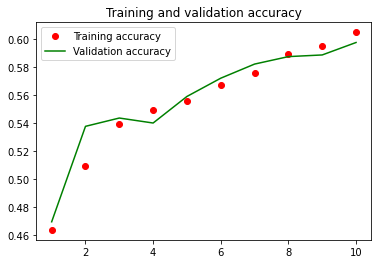

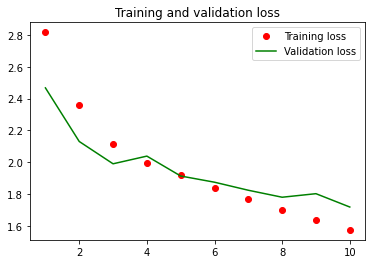

Estimator: <tensorflow.python.keras.engine.sequential.Sequential object at 0x7f0f2b57ab50>
Training accuracy:  0.6290035587188612
Testing accuracy:  0.5975103734439834
Confusion matrix:
  [[770   0   0 ...   0   0   0]
 [  0   0   0 ...   0   3   0]
 [  3   0   0 ...   0  17   1]
 ...
 [ 11   0   0 ...   0   0   0]
 [  0   0   0 ...   0 126   0]
 [  4   0   0 ...   0  41   0]]
Classification report:
                precision    recall  f1-score   support

           0       0.71      0.97      0.82       792
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00        28
           3       0.00      0.00      0.00         6
           4       0.19      0.53      0.28        51
           5       0.19      0.52      0.28        29
           6       0.00      0.00      0.00        24
           7       0.00      0.00      0.00         8
           8       0.00      0.00      0.00        17
           9       1.00      0.94      0.97        16


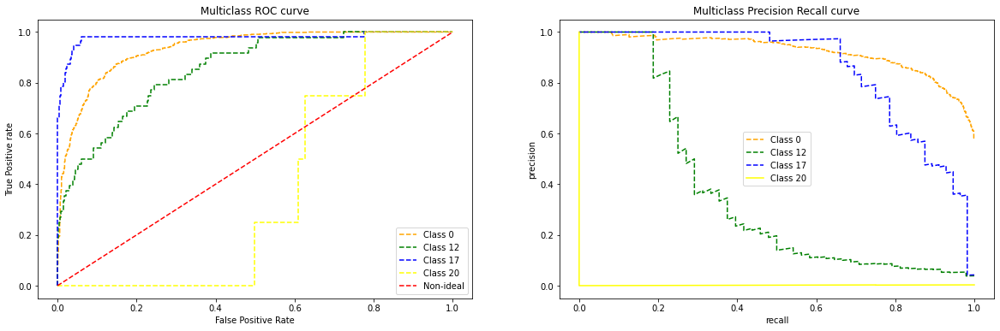

In [ ]:
model_name = 'NN-Model with vectorized data'
df_temp = run_classification(model_name, nn_model, X_train_v, X_test_v, y_train_n, y_test_n, arch_name= None, pipelineRequired=False, isDeepModel=True)
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

In [ ]:
df_resLog = df_resLog.sort_values(by='Cohen Kappa Score', ascending = False, ignore_index = True)
df_resLog

,Model,Train Accuracy,Test Accuracy,F1 Score,Cohen Kappa Score,Time Taken (sec)
0,Multinomial Logistic Regression with vectorize...,0.930160,0.630113,0.642346,0.514648,158.642740
1,Stochastic Gradient Descent,0.762011,0.654416,0.733147,0.482563,6.088795
2,Random Forest with vectorized i/p,0.931346,0.651452,0.724520,0.481713,60.809843
3,xgboost,0.887159,0.639597,0.699324,0.480809,361.044819
4,Decision trees with vectorized i/p,0.931346,0.601660,0.623561,0.467233,15.968921
5,Random Forest,0.934905,0.644932,0.726412,0.459787,11.697258
6,Random Forest with vectorized i/p & word count...,0.935647,0.639597,0.719322,0.453803,55.285981
7,K Nearest neighbor,0.693357,0.633669,0.714592,0.453007,2.782017
8,Decision trees,0.934905,0.590397,0.617562,0.448291,2.087770
9,Decision trees with vectorized i/p & word coun...,0.935647,0.582691,0.608252,0.440582,12.002043


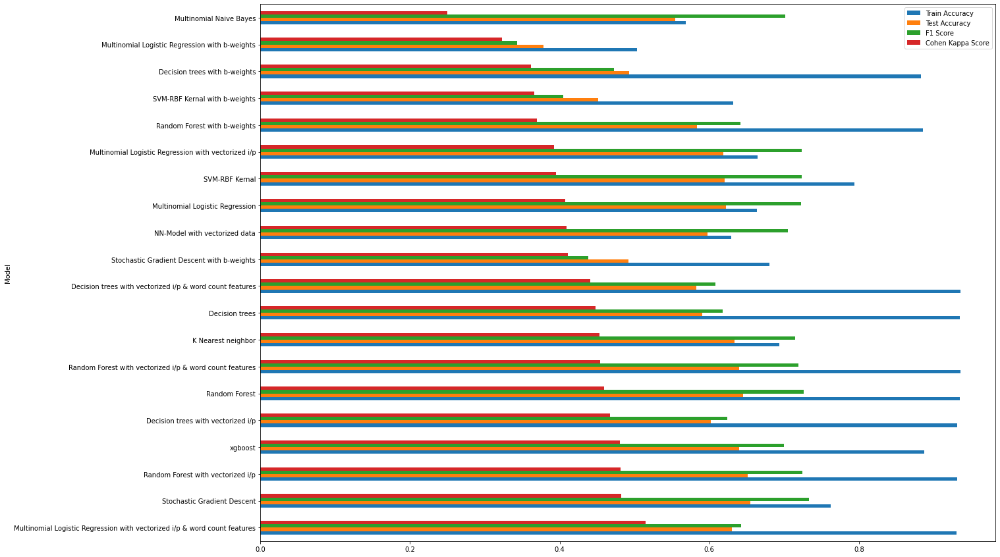

In [ ]:
df_resLog.plot(kind='barh',x='Model', figsize=[20,15])

**Observations:**

*   Random forest, Xgboost and Decision Tree seems to be overfitting due to high difference in Training and test accuracy

*   F1 score is higher than accuracy because it is calculated for the target group present in y_pred (lesser than the y_train ) Class Imbalance

*   The best performing model “ Stochastic Gradient Descent” performance reduces drastically from 65.44% to 49.19% once the parameter class_weight = ‘balanced'

*   SVM (RBF Kernel) and Xgboost seems to take a lot of time for execution compared to others even for lesser dimensional input. Thus avoided modelling with vectorized input.

*   K NN and Random Forest seem to handle imbalance better than SGD.

*   Meanwhile, SGD and Naïve Bayes might perform better if the class imbalance is taken care

**Basic input dataframe tuning insights:**

1.   Vectorized input with 'Max features' = 12270 
    *   It is quiet a high dimension for SGD, MultinomialNB, KNN. It takes a long time to converge.
    *   It improved the performance for Multinomial Logistic Regression, Random Forest & Decision Tree - Handles high dimension better

2.   Addition of word count features to the input dataframe 
    * It does not add much value to the perfomance

In [ ]:
df_resLog.to_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/basic_model_tuning_result.csv', index=False, encoding='utf_8_sig')

# **Model Performance Tuning**

## **Data centric tuning**

**Removing foreign language tickets for manual translation & modelling with only english language tickets for better model performance**

Note: This below csv is obtained from running the modeling section. Data tuning part can be run seperately from here if the csv is generated previously. Helps when the system crashes

In [ ]:
ticket_df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/cleaned_ticket_df.csv',encoding='utf-8')

In [ ]:
#Create a dataframe with only english words and other language as keep the other language dataset for manual translation
en_ticket_df = ticket_df[(ticket_df['language']=='en')]
manual_ticket_df = ticket_df[(ticket_df['language']!='en')]
en_ticket_df.drop(columns=['Short description','Description','Caller','language','cleaned_description','descr_len','num_wds','avg_word','uniq_wds'], inplace=True)

en_ticket_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7038 entries, 0 to 8430
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Assignment group  7038 non-null   object
 1   tokenized_desc    7038 non-null   object
dtypes: object(2)
memory usage: 165.0+ KB


In [ ]:
en_ticket_df[en_ticket_df.isnull().values == True]

,Assignment group,tokenized_desc


In [ ]:
len(en_ticket_df['Assignment group'].unique())

68

**Removing groups with only one ticket**

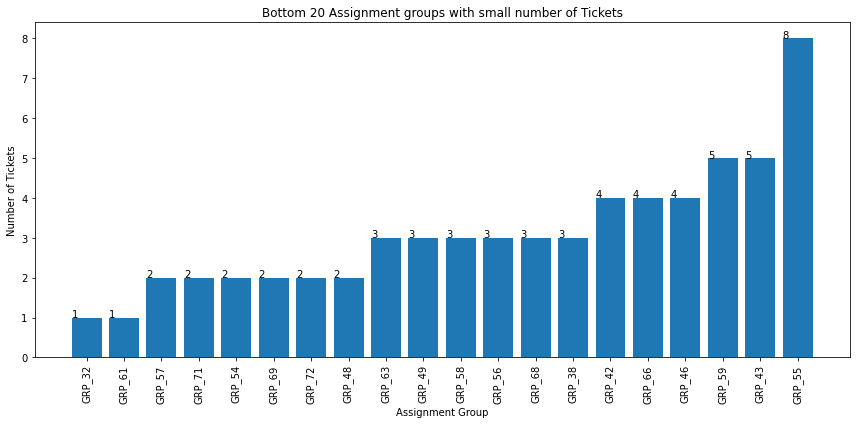

In [ ]:
bottom_20_en_df = en_ticket_df['Assignment group'].value_counts().nsmallest(20).reset_index()
plt.figure(figsize=(12,6))
bars = plt.bar(bottom_20_en_df['index'],bottom_20_en_df['Assignment group'])
plt.title('Bottom 20 Assignment groups with small number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

In [ ]:
# There is one group with just one ticket which doesnt add value to model prediction
en_ticket_df.drop(en_ticket_df[(en_ticket_df['Assignment group'] == 'GRP_32')].index , inplace=True)
en_ticket_df.drop(en_ticket_df[(en_ticket_df['Assignment group'] == 'GRP_61')].index , inplace=True)

**Group tickets with target group less than or equal to 40 tickets each into 'miscelaneous'**

In [ ]:
en_tkt_df = en_ticket_df['Assignment group'].value_counts().reset_index()
en_tkt_df['percentage'] = (en_tkt_df['Assignment group']/en_tkt_df['Assignment group'].sum())*100
en_tkt_df.head()

,index,Assignment group,percentage
0,GRP_0,3169,45.039795
1,GRP_8,657,9.337692
2,GRP_9,250,3.553155
3,GRP_2,233,3.311541
4,GRP_12,222,3.155202


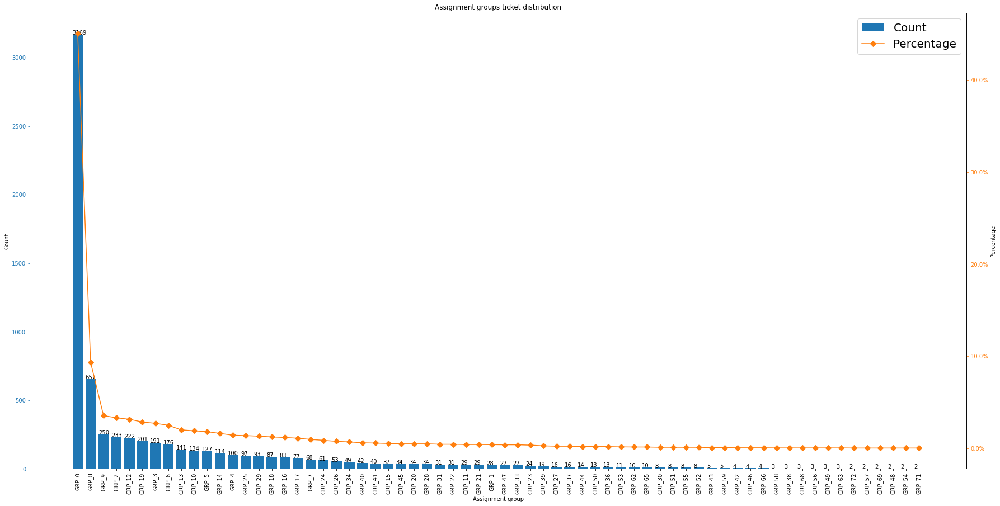

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(30, 15))
bars = ax.bar(en_tkt_df['index'], en_tkt_df['Assignment group'], color="C0", label = 'Count')
plt.xticks(rotation=90)
ax2 = ax.twinx()
ax2.plot(en_tkt_df.index, en_tkt_df["percentage"], color="C1", marker="D", ms=7, label = 'Percentage')
ax2.yaxis.set_major_formatter(PercentFormatter())

ax.tick_params(axis="y", colors="C0")
ax2.tick_params(axis="y", colors="C1")
lines_1, labels_1 = ax.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()

lines = lines_1 + lines_2
labels = labels_1 + labels_2

ax.legend(lines, labels, loc=0, prop={'size': 20})

ax.set_xlabel("Assignment group")
ax.set_ylabel("Count")
ax2.set_ylabel("Percentage")

plt.title('Assignment groups ticket distribution')

for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x(), yval + .005, yval)
plt.show()

In [ ]:
df_range = pd.DataFrame(columns=['Range','Group_count'])
one_ticket = {'Range':'1 ticket','Group_count':len(en_tkt_df[en_tkt_df['Assignment group'] < 2])}
_2_5_ticket = {'Range':'2-5 ticket',
              'Group_count':len(en_tkt_df[(en_tkt_df['Assignment group'] > 1)& (en_tkt_df['Assignment group'] < 6) ])}
_10_ticket = {'Range':' 6-10 ticket',
              'Group_count':len(en_tkt_df[(en_tkt_df['Assignment group'] > 5)& (en_tkt_df['Assignment group'] < 11)])}
_10_20_ticket = {'Range':' 11-20 ticket',
              'Group_count':len(en_tkt_df[(en_tkt_df['Assignment group'] > 10)& (en_tkt_df['Assignment group'] < 21)])}
_20_40_ticket = {'Range':' 21-40 ticket',
              'Group_count':len(en_tkt_df[(en_tkt_df['Assignment group'] > 20)& (en_tkt_df['Assignment group'] < 41)])}
_41_100_ticket = {'Range':' 41-100 ticket',
              'Group_count':len(en_tkt_df[(en_tkt_df['Assignment group'] > 40)& (en_tkt_df['Assignment group'] < 101)])}
_100_ticket = {'Range':' >100 ticket',
              'Group_count':len(en_tkt_df[(en_tkt_df['Assignment group'] > 100)])}
#append row to the dataframe
df_range = df_range.append([one_ticket,_2_5_ticket,_10_ticket,
                          _10_20_ticket,_20_40_ticket,_41_100_ticket,_100_ticket], ignore_index=True)

df_range

,Range,Group_count
0,1 ticket,0
1,2-5 ticket,17
2,6-10 ticket,6
3,11-20 ticket,7
4,21-40 ticket,13
5,41-100 ticket,11
6,>100 ticket,12


In [ ]:
misce_grp_df = en_ticket_df.groupby('Assignment group').filter(lambda x : len(x)<41)
misce_grp_df.loc[:,'Assignment group'] = 'miscelaneous'
top_grp_df = en_ticket_df.groupby('Assignment group').filter(lambda x : len(x)>40)
en_ticket_df = pd.concat([top_grp_df, misce_grp_df])

Overall 43 groups are present that have tickets less than 41 which are clubed into one 'miscellanous' group

In [ ]:
en_ticket_df.to_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/cleaned_en_ticket.csv', index=False, encoding='utf_8_sig')

**Identifying ideal 'max_features' for TF-IDF vectorization**  

In [ ]:
en_ticket_df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/cleaned_en_ticket.csv',encoding='utf-8')

In [ ]:
# Total no. of unique words in "tokenized_desc" column
len(Counter(" ".join(en_ticket_df['tokenized_desc'].str.lower().values.tolist()).split(" ")).items())

10004

In [ ]:
word_freq_df = pd.Series(' '.join(en_ticket_df['tokenized_desc']).split()).value_counts()
word_freq_df = word_freq_df.to_frame()
word_freq_df.head()

,0
job,1005
password,967
scheduler,950
issue,901
erp,871


In [ ]:
en_df_wrd_range = pd.DataFrame(columns=['Range','Group_count'])
freq_one = {'Range':'Freq 1','Group_count':len(word_freq_df[word_freq_df.iloc[:,0] < 2])}
freq_2_5 = {'Range':'Freq 2-5',
              'Group_count':len(word_freq_df[(word_freq_df.iloc[:,0] > 1)& (word_freq_df.iloc[:,0] < 6) ])}
freq_10 = {'Range':'Freq 6-10',
              'Group_count':len(word_freq_df[(word_freq_df.iloc[:,0] > 5)& (word_freq_df.iloc[:,0] < 11)])}
freq_10_20 = {'Range':'Freq 11-20',
              'Group_count':len(word_freq_df[(word_freq_df.iloc[:,0] > 10)& (word_freq_df.iloc[:,0] < 21)])}
freq_20_50 = {'Range':'Freq 21-50',
              'Group_count':len(word_freq_df[(word_freq_df.iloc[:,0] > 20)& (word_freq_df.iloc[:,0] < 51)])}
freq_51_100 = {'Range':'Freq 51-100',
              'Group_count':len(word_freq_df[(word_freq_df.iloc[:,0] > 50)& (word_freq_df.iloc[:,0] < 101)])}
freq_100 = {'Range':'Freq >100',
              'Group_count':len(word_freq_df[(word_freq_df.iloc[:,0] > 100)])}
#append row to the dataframe
en_df_wrd_range = en_df_wrd_range.append([freq_one,freq_2_5,freq_10,
                          freq_10_20,freq_20_50,freq_51_100,freq_100], ignore_index=True)

en_df_wrd_range

,Range,Group_count
0,Freq 1,5816
1,Freq 2-5,2402
2,Freq 6-10,646
3,Freq 11-20,412
4,Freq 21-50,392
5,Freq 51-100,156
6,Freq >100,180


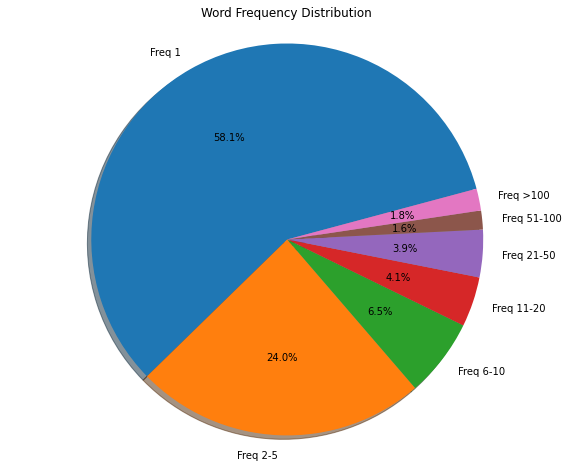

In [ ]:
plt.figure(figsize=(10, 8))
plt.pie(en_df_wrd_range['Group_count'],labels=en_df_wrd_range['Range'],autopct='%1.1f%%', startangle=15, shadow = True);
plt.title('Word Frequency Distribution')
plt.axis('equal');

In [ ]:
max_f = (en_df_wrd_range.iloc[0:5, 1:2].sum()).values #No of words with frequency less than 50
max_f = round(max_f[0])
max_f

9668

Words frequency greater than 50 contibute to only 3.4 percent of the whole set of unique words. These might add to noise among the target group word distribution. Thus can be removed while contructing TF-IDF vectorizer

**TF-IDF Transformation**

In [ ]:
tfidf_vec = TfidfVectorizer(max_features=max_f, analyzer = 'word', ngram_range=(1, 2))
tfidf_vec.fit(en_ticket_df['tokenized_desc'])
tckt_tfidf_en = tfidf_vec.fit_transform(en_ticket_df['tokenized_desc'])
pickle.dump(tfidf_vec,open("/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/tfidf_vec.pkl","wb"))

In [ ]:
# collect the tfid matrix in numpy array
array_en = tckt_tfidf_en.todense()

# store the tf-idf array into pandas dataframe
df_tfidf_en = pd.DataFrame(array_en)
df_tfidf_en.head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,9628,9629,9630,9631,9632,9633,9634,9635,9636,9637,9638,9639,9640,9641,9642,9643,9644,9645,9646,9647,9648,9649,9650,9651,9652,9653,9654,9655,9656,9657,9658,9659,9660,9661,9662,9663,9664,9665,9666,9667
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.122254,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.200305,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Check for null values before and after TFIDF vectorization
print(en_ticket_df[en_ticket_df.isnull().values == True])
print(df_tfidf_en[df_tfidf_en.isnull().values == True])
df_tfidf_en['Assignment_group']= en_ticket_df['Assignment group'].values

Empty DataFrame
Columns: [Assignment group, tokenized_desc]
Index: []
Empty DataFrame
Columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]
Index: []

[0 rows x 9668 columns]


**Label Encoding**

In [ ]:
#Label encoding non-vectorized dataframe
le = preprocessing.LabelEncoder()
df_tfidf_en['Assignment_group'] = df_tfidf_en['Assignment_group'].astype(str)
df_tfidf_en["LabelEncodings"] = le.fit_transform(df_tfidf_en['Assignment_group'])

# Creating dictionary for the labelencoder and pickling for deployment
target_enc_dict = dict(zip([], []))
target_values = df_tfidf_en['Assignment_group'].values
target_keys = df_tfidf_en["LabelEncodings"]
target_enc_dict = dict(zip(target_keys, target_values))
filehandler = open('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/target_enc_dict.obj','wb')
pickle.dump(target_enc_dict,filehandler)
filehandler.close()

y_classes_len = len(le.classes_)
le.classes_
print("No. of unique target group", y_classes_len)
df_tfidf_en.head()

No. of unique target group 24


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,9630,9631,9632,9633,9634,9635,9636,9637,9638,9639,9640,9641,9642,9643,9644,9645,9646,9647,9648,9649,9650,9651,9652,9653,9654,9655,9656,9657,9658,9659,9660,9661,9662,9663,9664,9665,9666,9667,Assignment_group,LabelEncodings
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.122254,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.200305,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,GRP_0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,GRP_0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,GRP_0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,GRP_0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,GRP_0,0


In [ ]:
bottom_5_en = df_tfidf_en['Assignment_group'].value_counts().nsmallest(5).reset_index()
bottom_5_en

,index,Assignment_group
0,GRP_40,42
1,GRP_34,49
2,GRP_26,53
3,GRP_24,61
4,GRP_7,68


Lowest ticket frequency count per group is 42 for the group 40

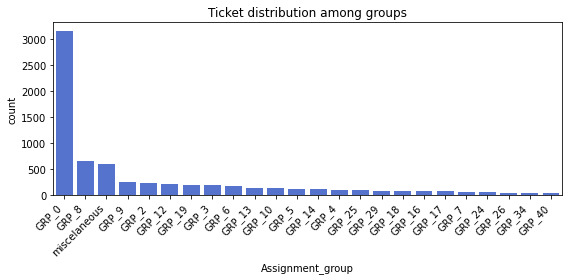

In [ ]:
descending_order = df_tfidf_en['Assignment_group'].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(8,4))
#add code to rotate the labels
ax=sns.countplot(x='Assignment_group', data=df_tfidf_en, color='royalblue',order=descending_order)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.title("Ticket distribution among groups")
plt.tight_layout()
plt.show()

In [ ]:
X_en = df_tfidf_en.iloc[:,:-2]
Y_en = df_tfidf_en["LabelEncodings"]
print('Shape of input dataset:', X_en.shape, Y_en.shape)
print(f"Original class counts: {Counter(Y_en)}") # Target group distribution

Shape of input dataset: (7036, 9668) (7036,)
Original class counts: Counter({0: 3169, 21: 657, 23: 611, 22: 250, 9: 233, 2: 222, 8: 201, 14: 191, 19: 176, 3: 141, 1: 134, 18: 127, 4: 114, 16: 100, 11: 97, 13: 93, 7: 87, 5: 83, 6: 77, 20: 68, 10: 61, 12: 53, 15: 49, 17: 42})


In [ ]:
df_tfidf_en.to_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/cleaned_tuned_vec_ticket.csv', index=False, encoding='utf_8_sig')

Imbalance still persist

In [ ]:
df_tfidf_en = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/cleaned_tuned_vec_ticket.csv',encoding='utf-8')

**Down-Sampling**

In [ ]:
enn = EditedNearestNeighbours(sampling_strategy='majority', n_neighbors=25, kind_sel='mode')
X_en_enn, y_en_enn = enn.fit_resample(X_en, Y_en)
print('Shape of sampled input dataset:', X_en_enn.shape, y_en_enn.shape)
print(f"Original class counts: {Counter(y_en_enn)}")  # Target group distribution after down sampling
print(len(Counter(y_en_enn)))

Shape of sampled input dataset: (6936, 9668) (6936,)
Original class counts: Counter({0: 3069, 21: 657, 23: 611, 22: 250, 9: 233, 2: 222, 8: 201, 14: 191, 19: 176, 3: 141, 1: 134, 18: 127, 4: 114, 16: 100, 11: 97, 13: 93, 7: 87, 5: 83, 6: 77, 20: 68, 10: 61, 12: 53, 15: 49, 17: 42})
24


**UP-Sampling**

In [ ]:
for i in (range(9)):
  smote = SMOTE(sampling_strategy='minority', random_state=42)
  print("interation: ", i)
  X_en_sm, y_en_sm = smote.fit_resample(X_en_enn, y_en_enn)
  X_en_enn = X_en_sm
  y_en_enn = y_en_sm
  print('Shape of sampled input dataset:', X_en_sm.shape, y_en_sm.shape)
  print(f"Original class counts: {Counter(y_en_sm)}")  # Target group distribution after up-sampling

interation:  0
Shape of sampled input dataset: (9963, 9668) (9963,)
Original class counts: Counter({0: 3069, 17: 3069, 21: 657, 23: 611, 22: 250, 9: 233, 2: 222, 8: 201, 14: 191, 19: 176, 3: 141, 1: 134, 18: 127, 4: 114, 16: 100, 11: 97, 13: 93, 7: 87, 5: 83, 6: 77, 20: 68, 10: 61, 12: 53, 15: 49})
interation:  1
Shape of sampled input dataset: (12983, 9668) (12983,)
Original class counts: Counter({0: 3069, 15: 3069, 17: 3069, 21: 657, 23: 611, 22: 250, 9: 233, 2: 222, 8: 201, 14: 191, 19: 176, 3: 141, 1: 134, 18: 127, 4: 114, 16: 100, 11: 97, 13: 93, 7: 87, 5: 83, 6: 77, 20: 68, 10: 61, 12: 53})
interation:  2
Shape of sampled input dataset: (15999, 9668) (15999,)
Original class counts: Counter({0: 3069, 12: 3069, 15: 3069, 17: 3069, 21: 657, 23: 611, 22: 250, 9: 233, 2: 222, 8: 201, 14: 191, 19: 176, 3: 141, 1: 134, 18: 127, 4: 114, 16: 100, 11: 97, 13: 93, 7: 87, 5: 83, 6: 77, 20: 68, 10: 61})
interation:  3
Shape of sampled input dataset: (19007, 9668) (19007,)
Original class count

In [ ]:
sampled_tkt_df = pd.merge(X_en_sm, y_en_sm, left_index=True, right_index=True)
sampled_tkt_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,9629,9630,9631,9632,9633,9634,9635,9636,9637,9638,9639,9640,9641,9642,9643,9644,9645,9646,9647,9648,9649,9650,9651,9652,9653,9654,9655,9656,9657,9658,9659,9660,9661,9662,9663,9664,9665,9666,9667,LabelEncodings
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.122254,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.200305,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [ ]:
sampled_tkt_df.to_pickle('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/resampled_tickets.pkl')

Note: Run the code from here if it crashes after this since the csv is generated

### **Modelling**

In [ ]:
sampled_tkt_df = pd.read_pickle('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/resampled_tickets.pkl')

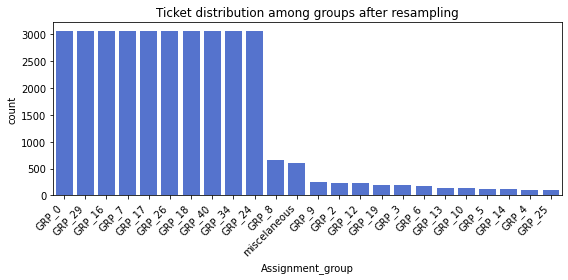

In [ ]:
# No of unique targets present in the upsampled dataset 
Y_dist = pd.DataFrame()
Y_dist['Assignment_group'] = le.inverse_transform(sampled_tkt_df['LabelEncodings'])
descending_order = Y_dist['Assignment_group'].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(8,4))
ax=sns.countplot(x='Assignment_group', data=Y_dist, color='royalblue',order=descending_order)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.title("Ticket distribution among groups after resampling")
plt.tight_layout()
plt.show()

In [ ]:
X_en_sm = sampled_tkt_df.iloc[:,:-1]
y_en_sm = sampled_tkt_df['LabelEncodings']

In [ ]:
# vectorized cleansed data
n_classes = len(y_en_sm.unique())
print(n_classes)
X_train_en, X_test_en, y_train_en, y_test_en = train_test_split(X_en_sm, 
                                                    y_en_sm	, 
                                                    test_size=0.20, 
                                                    random_state=42, stratify = y_en_sm)
print('Shape of the training set:', X_train_en.shape, X_test_en.shape)
print('Shape of the test set:', y_train_en.shape, y_test_en.shape)

24
Shape of the training set: (27155, 9668) (6789, 9668)
Shape of the test set: (27155,) (6789,)


In [ ]:
df_resLog = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/basic_model_tuning_result.csv',encoding='utf-8')

In [ ]:
df_tuned_result = pd.DataFrame()

**Multinomial Logistic Regression**

In [ ]:
df_LR_Results = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/LR_Results.csv',encoding='utf-8')

start
Estimator: LogisticRegression(class_weight='balanced', multi_class='multinomial')
Training accuracy:  0.94177867795986
Testing accuracy:  0.9058771542200619
Confusion matrix:
  [[445   0   5   5   4  14   0   0  28  18   0  10  12   3  17   9   3   6
    0   1   1   0   1  32]
 [  0   8   0   1   0   0   0   1   1   2   0   0   0   0   0   0   0   0
   12   0   0   0   0   2]
 [  2   0  27   0   5   0   0   0   1   1   0   0   0   0   1   1   0   0
    4   0   0   0   0   2]
 [  0   0   1  18   0   0   0   4   0   0   0   0   0   1   0   0   0   0
    1   0   0   0   0   3]
 [  4   0   3   0  10   0   0   2   0   0   0   0   0   1   0   0   0   0
    0   0   0   0   0   3]
 [  0   0   0   0   0 614   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0]
 [  0   0   0   0   0   0 614   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0]
 [ 17   4   0   0   0   0   0 576   0   0   0   0   0   0   0   0   0   0
   12   0   0   2   1   2]
 [  6   0

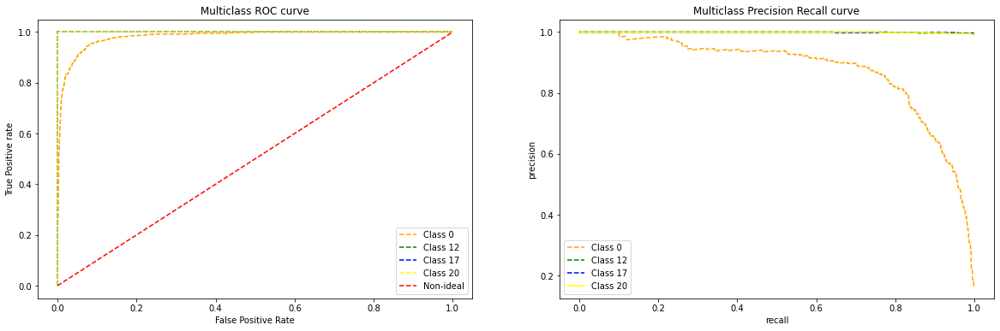

In [ ]:
model_name = 'Multinomial Logistic Regression data Tuned'
df_temp = run_classification(model_name, LogisticRegression(multi_class='multinomial', solver='lbfgs',class_weight='balanced'), X_train_en, X_test_en, y_train_en, y_test_en, arch_name= None, pipelineRequired=False)
df_tuned_result = pd.concat([df_tuned_result, df_temp])
df_LR_Results = pd.concat([df_LR_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

In [ ]:
df_LR_Results.sort_values(by='Cohen Kappa Score', ascending = False, ignore_index = True)

,Model,Train Accuracy,Test Accuracy,F1 Score,Cohen Kappa Score,Time Taken (sec)
0,Multinomial Logistic Regression data Tuned,0.941779,0.905877,0.901679,0.897513,214.002483
1,Multinomial Logistic Regression with vectorize...,0.930160,0.630113,0.642346,0.514648,147.166
2,Multinomial Logistic Regression,0.663553,0.621814,0.722842,0.407764,22.5059
3,Multinomial Logistic Regression with vectorize...,0.664294,0.618257,0.723811,0.392523,144.577
4,Multinomial Logistic Regression with b-weights,0.502966,0.378779,0.342945,0.322900,14.4474


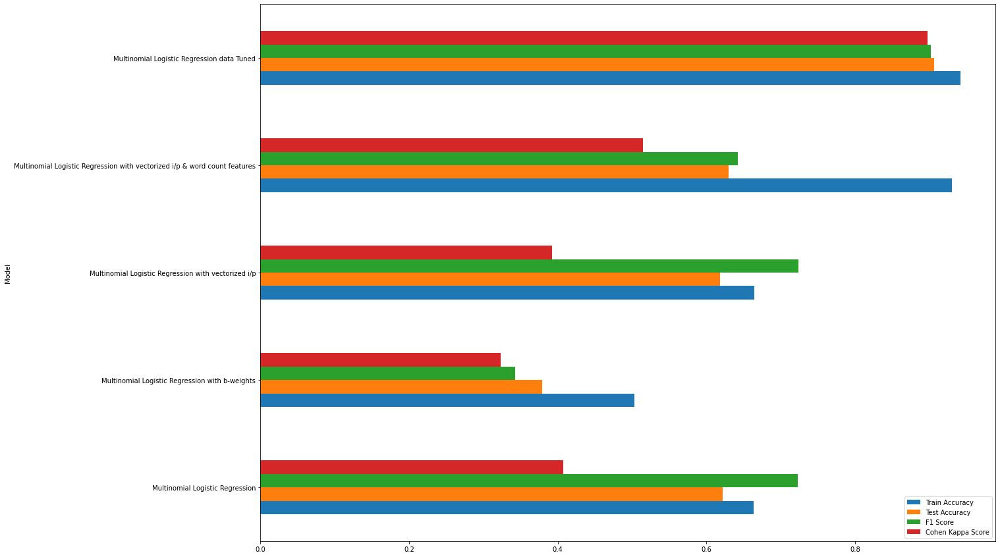

In [ ]:
df_LR_Results.plot(kind='barh',x='Model', figsize=[20,15])

**Random Forest**

In [ ]:
df_RF_Results = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/RF_Results.csv',encoding='utf-8')

start
Estimator: RandomForestClassifier(class_weight='balanced', random_state=42)
Training accuracy:  0.9746271404897809
Testing accuracy:  0.9217852408307556
Confusion matrix:
  [[581   0   0   0   0   8   0   1   6   0   0   2   0   2   1   2   0   1
    0   1   2   1   0   6]
 [ 12   1   0   1   0   0   0   1   0   0   0   0   0   0   0   0   0   0
   12   0   0   0   0   0]
 [ 12   0  18   0   4   0   0   0   0   0   0   0   0   0   0   1   0   0
    4   0   0   2   0   3]
 [  9   0   0   8   0   0   0   3   0   0   0   0   0   3   0   0   0   0
    1   0   0   0   0   4]
 [ 12   0   1   0   6   0   0   1   0   0   0   0   0   1   0   0   0   0
    0   0   0   0   0   2]
 [  2   0   0   0   0 612   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0]
 [  0   0   0   0   0   0 614   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0]
 [  0   0   0   0   0   0   0 606   0   0   0   0   0   0   0   0   0   0
    8   0   0   0   0   0]
 [ 28   0   0

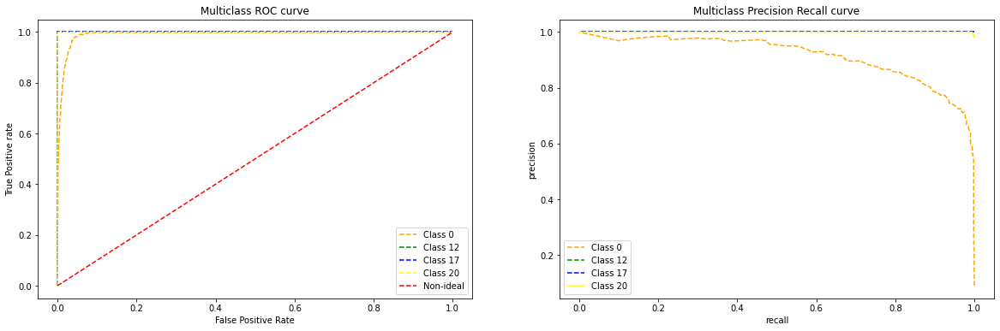

In [ ]:
model_name = 'Random Forest data Tuned'
df_temp = run_classification(model_name, RandomForestClassifier(n_estimators=100, class_weight = 'balanced', random_state = 42), X_train_en, X_test_en, y_train_en, y_test_en, arch_name= None, pipelineRequired=False)
df_tuned_result = pd.concat([df_tuned_result, df_temp])
df_RF_Results = pd.concat([df_RF_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

In [ ]:
df_RF_Results.sort_values(by='Cohen Kappa Score', ascending = False, ignore_index = True)

,Model,Train Accuracy,Test Accuracy,F1 Score,Cohen Kappa Score,Time Taken (sec)
0,Random Forest data Tuned,0.974627,0.921785,0.930046,0.914464,72.547775
1,Random Forest with vectorized i/p,0.931346,0.654416,0.728320,0.484662,44.7574
2,Random Forest,0.934905,0.647303,0.727710,0.464623,11.5601
3,Random Forest with vectorized i/p & word count...,0.935647,0.636633,0.714570,0.448460,40.5495
4,Random Forest with b-weights,0.890866,0.587433,0.649003,0.372716,13.923


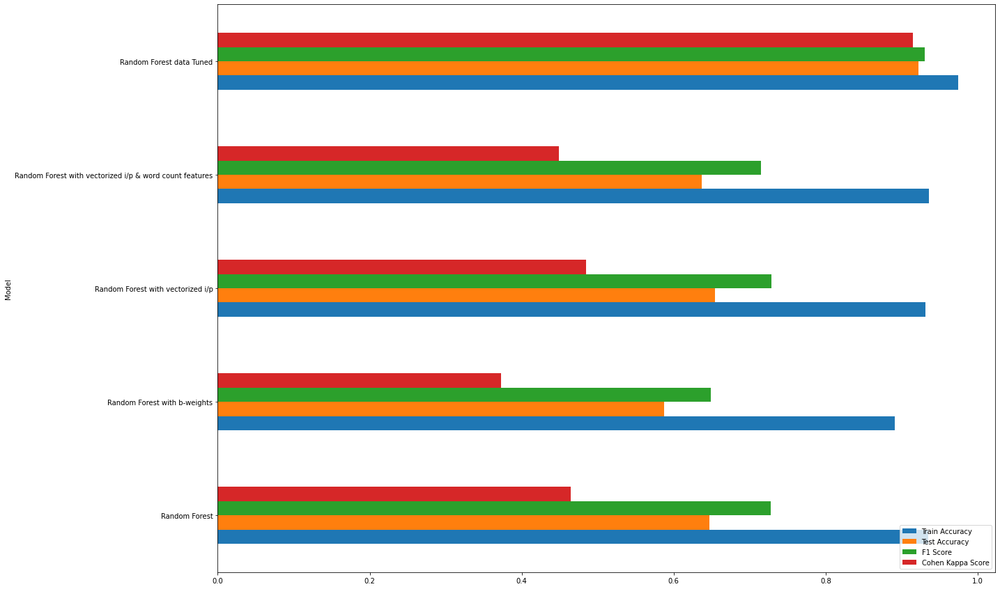

In [ ]:
df_RF_Results.plot(kind='barh',x='Model', figsize=[20,15])

**Neural Network**

In [ ]:
X_train_en_nn = X_train_en.to_numpy()
X_test_en_nn = X_test_en.to_numpy()
y_train_en_nn = np.array(y_train_en.values.tolist())
y_test_en_nn = np.array(y_test_en.values.tolist())

In [ ]:
nn_model = Sequential()
nn_model.add(Dense(500, input_shape=(len(X_train_en_nn[0]),), activation='relu'))
nn_model.add(Dropout(0.5))
nn_model.add(Dense(200, activation='relu'))
nn_model.add(Dropout(0.3))
nn_model.add(Dense(80, activation='relu'))
nn_model.add(Dropout(0.2))
nn_model.add(Dense(68, activation='softmax', name='Output'))
nn_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 500)               4834500   
_________________________________________________________________
dropout (Dropout)            (None, 500)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               100200    
_________________________________________________________________
dropout_1 (Dropout)          (None, 200)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 80)                16080     
_________________________________________________________________
dropout_2 (Dropout)          (None, 80)                0         
_________________________________________________________________
Output (Dense)               (None, 68)                5

In [ ]:
sgd = SGD(learning_rate=0.01, decay=1e-6, momentum=0.9, nesterov=True)
nn_model.compile(loss='sparse_categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])

Epoch 1/10
849/849 [==============================] - 8s 5ms/step - loss: 1.9698 - accuracy: 0.4317 - val_loss: 0.5689 - val_accuracy: 0.8726
Epoch 2/10
849/849 [==============================] - 3s 4ms/step - loss: 0.5291 - accuracy: 0.8716 - val_loss: 0.3839 - val_accuracy: 0.8951
Epoch 3/10
849/849 [==============================] - 3s 4ms/step - loss: 0.3994 - accuracy: 0.8945 - val_loss: 0.3428 - val_accuracy: 0.9051
Epoch 4/10
849/849 [==============================] - 3s 4ms/step - loss: 0.3488 - accuracy: 0.9034 - val_loss: 0.3248 - val_accuracy: 0.9091
Epoch 5/10
849/849 [==============================] - 3s 4ms/step - loss: 0.3169 - accuracy: 0.9103 - val_loss: 0.3013 - val_accuracy: 0.9127
Epoch 6/10
849/849 [==============================] - 4s 4ms/step - loss: 0.2888 - accuracy: 0.9167 - val_loss: 0.2937 - val_accuracy: 0.9168
Epoch 7/10
849/849 [==============================] - 4s 4ms/step - loss: 0.2640 - accuracy: 0.9211 - val_loss: 0.2935 - val_accuracy: 0.9163
Epoch 

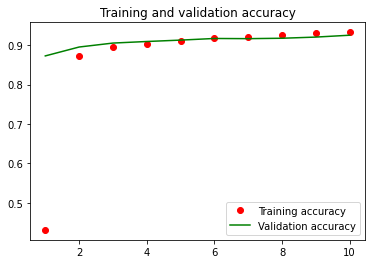

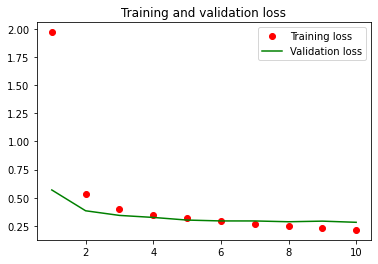

Estimator: <tensorflow.python.keras.engine.sequential.Sequential object at 0x7f5659460590>
Training accuracy:  0.9526054133677039
Testing accuracy:  0.9250257769921932
Confusion matrix:
  [[549   0   4   0   0   5   0   0   2   8   0   1   8   3   2   7   0   4
    0   0   2   0   0  19]
 [  2   1   0   1   0   0   0   3   0   1   0   0   0   0   0   0   0   0
    0   0   0  12   0   7]
 [  8   0  26   0   0   0   0   0   0   4   0   0   1   0   0   0   0   0
    0   0   0   4   0   1]
 [  1   0   0  11   0   0   0   6   0   1   0   0   0   3   0   0   0   0
    0   0   0   1   0   5]
 [  8   0   5   1   0   0   0   2   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   7]
 [  0   0   0   0   0 614   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0]
 [  0   0   0   0   0   0 614   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0]
 [  0   0   0   0   0   0   0 601   0   0   0   0   0   0   0   0   0   0
    0   0   0  13   0   0]
 [ 2

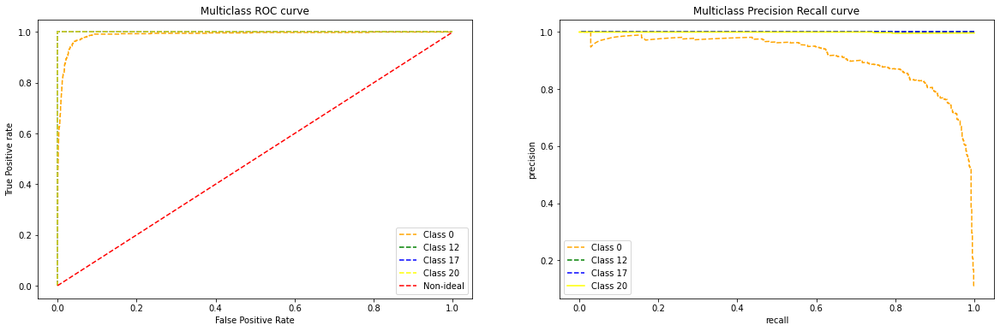

In [ ]:
model_name = 'NN-Model with data Tuned'
df_temp = run_classification(model_name, nn_model, X_train_en_nn, X_test_en_nn, y_train_en_nn, y_test_en_nn, arch_name= None, pipelineRequired=False, isDeepModel=True)
df_tuned_result = pd.concat([df_tuned_result, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

In [ ]:
df_tuned_result = df_tuned_result.sort_values(by='Cohen Kappa Score', ascending = False, ignore_index = True)
df_tuned_result

,Model,Train Accuracy,Test Accuracy,F1 Score,Cohen Kappa Score,Time Taken (sec)
0,NN-Model with data Tuned,0.952605,0.925026,0.937467,0.918083,54.651899
1,Random Forest data Tuned,0.974627,0.921785,0.930046,0.914464,72.547775
2,Multinomial Logistic Regression data Tuned,0.941779,0.905877,0.901679,0.897513,214.002483


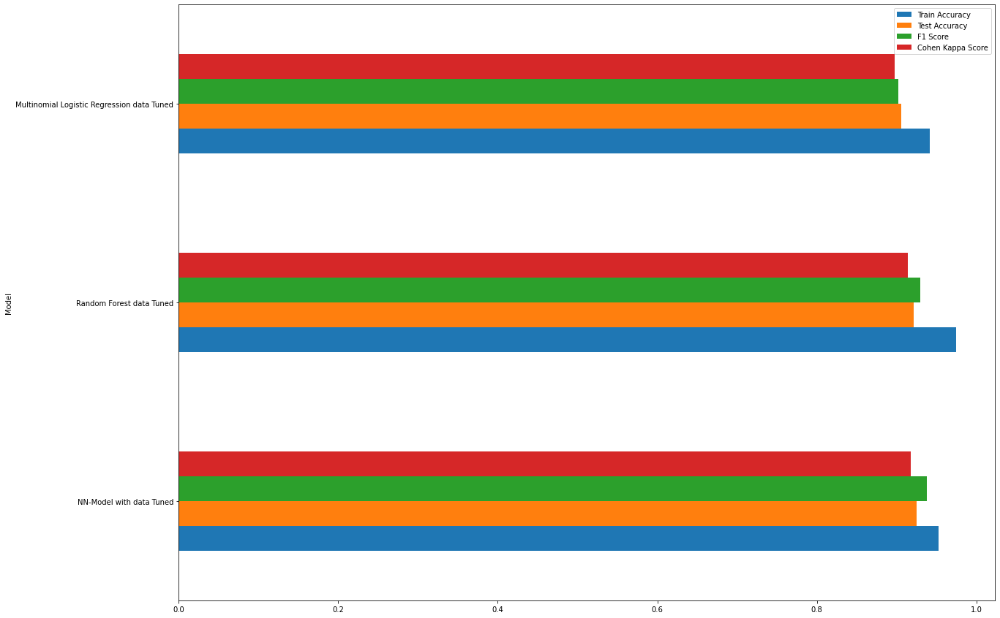

In [ ]:
df_tuned_result.plot(kind='barh',x='Model', figsize=[20,15])

In [ ]:
df_resLog = df_resLog.sort_values(by='Cohen Kappa Score', ascending = False, ignore_index = True)
df_resLog

,Model,Train Accuracy,Test Accuracy,F1 Score,Cohen Kappa Score,Time Taken (sec)
0,NN-Model with data Tuned,0.952605,0.925026,0.937467,0.918083,54.651899
1,Random Forest data Tuned,0.974627,0.921785,0.930046,0.914464,72.547775
2,Multinomial Logistic Regression data Tuned,0.941779,0.905877,0.901679,0.897513,214.002483
3,Multinomial Logistic Regression with vectorize...,0.930160,0.630113,0.642346,0.514648,158.643
4,Stochastic Gradient Descent,0.762011,0.654416,0.733147,0.482563,6.08879
5,Random Forest with vectorized i/p,0.931346,0.651452,0.724520,0.481713,60.8098
6,xgboost,0.887159,0.639597,0.699324,0.480809,361.045
7,Decision trees with vectorized i/p,0.931346,0.601660,0.623561,0.467233,15.9689
8,Random Forest,0.934905,0.644932,0.726412,0.459787,11.6973
9,Random Forest with vectorized i/p & word count...,0.935647,0.639597,0.719322,0.453803,55.286


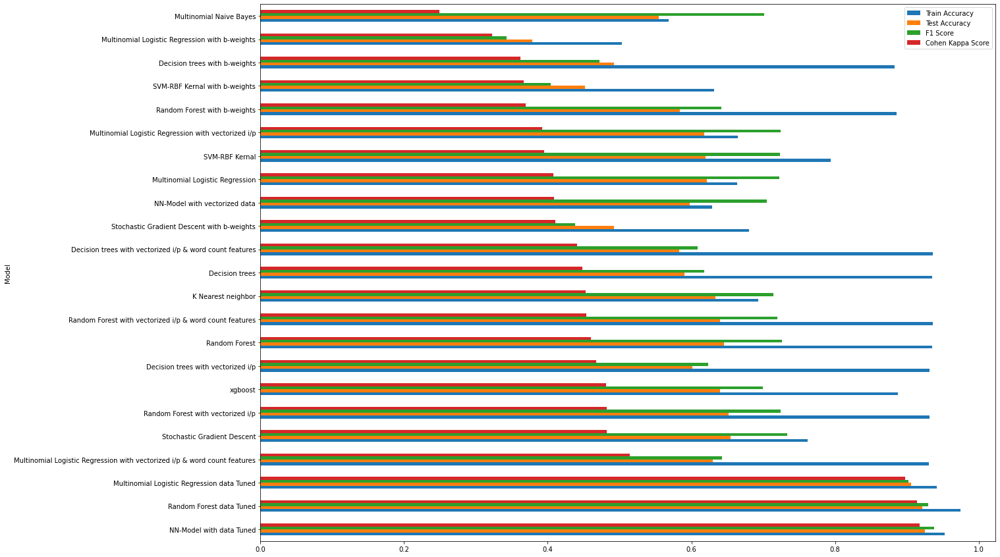

In [ ]:
df_resLog.plot(kind='barh',x='Model', figsize=[20,15])

**Conclusions:**

As per the model performance based on various metrics like test accuracy, F1-score, Cohen-Kappa-Score - Neural Network performs the best and considered as final model for the project

Note: If you have run the data tuning part you would have obtained these csv file below. You can run the model seperately from here once the csv is generated.

en_ticket_df = DataFrame without TF-IDF vectorisation and sampling

en_ticket_df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/cleaned_en_ticket.csv',encoding='utf-8')

sampled_tkt_df = Sampled dataframe

sampled_tkt_df = pd.read_pickle('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/resampled_tickets.pkl')